<a href="https://colab.research.google.com/github/danielsoy/AutoEncoder-SSIM-for-unsupervised-anomaly-detection-/blob/master/funka_botella_MvTec_kaggle_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# UNSUPERVISED ANOMALY SEGMENTATION
### This is a implementation of **DFR: Deep Feature Reconstruction for Unsupervised Anomaly Segmentation** https://arxiv.org/abs/2012.07122
#### We train only with OK images, and then we predict a hotmap, where high areas are presumably anomalous
#### The pretrained weights provided by me (input anomalysegmentation-weights) are not very good because Kaggle limits training time to 9hrs

## IMPORTS

In [1]:
!pip install tqdm

In [2]:
import tensorflow as tf  
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras import Input, Model, Sequential
from tensorflow.keras import layers

from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

from skimage import io
from skimage.transform import resize

import numpy as np

from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
import cv2

import random
import os
from tqdm import tqdm

from random import randrange

In [3]:
from google.colab import drive

In [4]:
drive.mount('/content/drive')

Mounted at /content/drive


## Custom Data Generator

In [12]:
class CustomDataGen(tf.keras.utils.Sequence):
    
    def __init__(self, path = "../content/drive/MyDrive/input botella/mvtecad-mvtec-anomaly-detection/mvtec_anomaly_detection/botella/",
                 batch_size = 1,
                 input_size=(112, 112),
                 shuffle=True, seed = None, subset = 'training'):
        
        self.image_data_generator = ImageDataGenerator(rescale=1. / 255, data_format='channels_last',     
            #zoom_range = 0.1,
            #width_shift_range = 0.05,
            #height_shift_range = 0.05,
            #brightness_range=(0.95,1.05)
        )
        
        if seed is None:
            random.randint(0, 2**32)
            
        self.batch_size = batch_size
        self.input_size = input_size
        
        self.X_paths = [os.fsdecode(file) for file in os.scandir(f"{path}/train/good")]
        self.X_train, self.X_val = train_test_split(self.X_paths, test_size=0.2, random_state = seed, shuffle = True)
        
        if subset == 'training':            
            self.X = self.X_train
        elif subset == 'validation':
            self.X = self.X_val
            
        self.n = len(self.X)
    
    
    def __getitem__(self, index):
        
        data_x = []
        
        for i in range(self.batch_size):
            image = cv2.imread(self.X[self.batch_size * index + i])
            
            image = self.image_data_generator.random_transform(image)
            
            image = image / 255
            
            image = tf.image.resize(image, self.input_size)
            data_x.append(image)
            
        data_x = np.array(data_x)
        
        return data_x, data_x
    
    def __len__(self):            
        return self.n // self.batch_size

In [13]:
INPUT_SIZE = (112,112)
seed = random.randint(0, 2**32)
train_datagen = CustomDataGen(input_size = INPUT_SIZE, batch_size = 4, seed = seed)
validation_datagen = CustomDataGen(input_size = INPUT_SIZE, subset = "validation", seed = seed) 

In [14]:
#Check we dont have the same images in train and validation sets
any([value in train_datagen.X for value in validation_datagen.X])

False

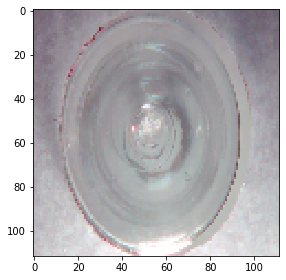

In [15]:
x, y = train_datagen[0]
io.imshow(x[0])
io.show()

## Model

In [16]:
input_model_filepath = "../input/anomalysegmentation-weights/anomaly-segmentation-model_vgg19.h5"
output_model_filepath = "./anomaly-segmentation-model.h5"
#model class
#Implementation of DFR: Deep Feature Reconstruction for Unsupervised Anomaly Segmentation https://arxiv.org/abs/2012.07122
class AnomalySegmentator(tf.keras.Model):
    def __init__(self, init_layer = 0, end_layer = None):
        super(AnomalySegmentator, self).__init__()
        #self.L2_weight = 1e-6
        self.init_layer = init_layer
        self.end_layer = end_layer
        
    def build_autoencoder(self, c0, cd):
        self.autoencoder = Sequential([
            layers.InputLayer((self.map_shape[0]//4, self.map_shape[1]//4, c0)),
            layers.Conv2D((c0 + cd) // 2,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(2*cd,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(cd,(1,1), padding='same'),
            layers.Conv2D(2*cd,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D((c0 + cd) // 2,(1,1), padding='same', activation = tf.keras.layers.LeakyReLU(alpha=0.1)),
            layers.Conv2D(c0,(1,1), padding='same')            
            
        ])
        
    def build(self, input_shape):
        
        self.vgg = VGG19(include_top = False, weights = 'imagenet', input_shape=input_shape[1:])
        self.features_list = [layer.output for layer in self.vgg.layers if 'conv' in layer.name][self.init_layer:self.end_layer]
        
        self.feature_extractor = Model(inputs = self.vgg.input, 
                                       outputs = self.features_list)
        self.feature_extractor.trainable = False   
        
        self.threshold = tf.Variable(0, trainable = False, dtype = tf.float32)

        self.map_shape = self.features_list[0].shape[1:-1]
        
        self.average_pooling = layers.AveragePooling2D(pool_size=(4, 4), strides=(4,4))       
        
        
        
        self.c0 = sum([feature.shape[-1] for feature in self.features_list])        
        self.cd = 40        
        self.build_autoencoder(self.c0, self.cd)
        
          
    def call(self, inputs):
        features = self.feature_extractor(inputs)
        resized_features = [tf.image.resize(feature, self.map_shape) for feature in features]
        resized_features = tf.concat(resized_features, axis = -1)
        
        resized_features = self.average_pooling(resized_features)

        autoencoder_output = self.autoencoder(resized_features)
        return tf.reduce_sum((autoencoder_output - resized_features)**2, axis = -1)
        
    def reconstruction_loss(self):
        @tf.function
        def _loss(y_true, y_pred):
            loss = tf.reduce_mean(y_pred, axis = (1,2)) / (tf.cast(tf.shape(y_pred)[0], tf.float32) * self.c0)
            return loss
                    
        return _loss

    def compute_threshold(self, data_loader, fpr = 0.05):
      error = []
      for i in tqdm(range(len(data_loader))):
        x, y = data_loader[i]
        error.append(self(x))

      threshold = np.percentile(error, 100 - fpr)
      self.threshold = tf.Variable(threshold, trainable = False, dtype = tf.float32)
        
    def compute_pca(self, data_loader):
        extraction_per_sample = 20
        
        extractions = []        
        for i in tqdm(range(len(data_loader))):
            x, _ = data_loader[i]     
            
            features = self.feature_extractor(x)
            resized_features = [tf.image.resize(feature, self.map_shape) for feature in features]
            resized_features = tf.concat(resized_features, axis = -1)

            resized_features = self.average_pooling(resized_features)
            
            for feature in resized_features:
                
                for _ in range(extraction_per_sample):                    
                
                    row, col = randrange(feature.shape[0]), randrange(feature.shape[1])
                    extraction = feature[row, col]
                    extractions.append(extraction)
            
        extractions = np.array(extractions)
        print(f"Extractions Shape: {extractions.shape}")
        pca = PCA(0.9, svd_solver = "full")
        pca.fit(extractions)
        self.cd = pca.n_components_
        self.build_autoencoder(self.c0, self.cd)
        print(f"Components with explainable variance 0.9 -> {self.cd}")
        
as_model = AnomalySegmentator()
as_model.compile(Adam(1e-4), loss = as_model.reconstruction_loss())

In [10]:
as_model.build((None, *INPUT_SIZE,3))
as_model.compute_pca(train_datagen)

80150528/80134624 [==============================] - 1s 0us/step


100%|██████████| 30/30 [01:23<00:00,  2.80s/it]


Extractions Shape: (2400, 5504)
Components with explainable variance 0.9 -> 39


## Training

# TESTING

Epoch 1/500
30/30 [==============================] - 17s 583ms/step - loss: 0.1072 - val_loss: 0.4423 - lr: 1.0000e-04
Epoch 2/500
30/30 [==============================] - 17s 581ms/step - loss: 0.1034 - val_loss: 0.4402 - lr: 1.0000e-04
Epoch 3/500
30/30 [==============================] - 17s 558ms/step - loss: 0.1030 - val_loss: 0.4448 - lr: 1.0000e-04
Epoch 4/500
30/30 [==============================] - 17s 558ms/step - loss: 0.1027 - val_loss: 0.4419 - lr: 1.0000e-04
Epoch 5/500
30/30 [==============================] - 18s 586ms/step - loss: 0.1012 - val_loss: 0.4349 - lr: 1.0000e-04
Epoch 6/500
30/30 [==============================] - 17s 559ms/step - loss: 0.1016 - val_loss: 0.4404 - lr: 1.0000e-04
Epoch 7/500
30/30 [==============================] - 18s 587ms/step - loss: 0.1020 - val_loss: 0.4320 - lr: 1.0000e-04
Epoch 8/500
30/30 [==============================] - 18s 586ms/step - loss: 0.1000 - val_loss: 0.4317 - lr: 1.0000e-04
Epoch 9/500
30/30 [=============================

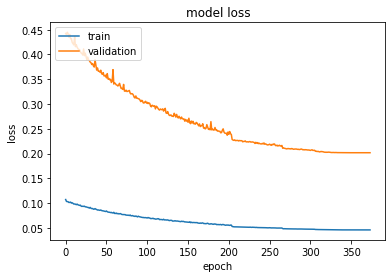

100%|██████████| 30/30 [00:07<00:00,  3.78it/s]


In [20]:
#True if we want to train the model
if True:
    # Training the model
    plateau = tf.keras.callbacks.ReduceLROnPlateau(
      monitor='val_loss', factor=0.5, patience=5, verbose = 1
    )
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', mode='min', verbose=1,
                                          patience=15)  # Early stopping (stops training when validation doesn't improve for {patience} epochs)
    save_best = tf.keras.callbacks.ModelCheckpoint(output_model_filepath, monitor='val_loss', save_best_only=True,
                                                mode='min', save_weights_only = True)  # Saves the best version of the model to disk (as measured on the validation data set)
          
    history = as_model.fit(train_datagen,
        epochs=500,
        validation_data=validation_datagen,
        shuffle=True,
        callbacks=[es, save_best, plateau])
    #Training history
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')
    plt.show()
    
    as_model.load_weights(output_model_filepath)
    as_model.compute_threshold(train_datagen)
    as_model.save_weights(output_model_filepath)
else:
    
    as_model.build((None, *INPUT_SIZE,3))
    as_model.load_weights(input_model_filepath)
    as_model.compute_threshold(train_datagen)
    as_model.summary()
    as_model.autoencoder.summary()

In [21]:
classes = ['good', 'manipulated_front', 'scratch_head', 'scratch_neck', 'thread_side', 'thread_top'] #only 0 index is GOOD
test_datagen = ImageDataGenerator(rescale=1. / 255, data_format='channels_last')
test_generator = test_datagen.flow_from_directory("../content/drive/MyDrive/input botella/mvtecad-mvtec-anomaly-detection/mvtec_anomaly_detection/botella/test", 
                                                  target_size = INPUT_SIZE,
                                                  batch_size = 1,
                                                  class_mode = 'sparse')

##  /content/drive/MyDrive/input botella/mvtecad-mvtec-anomaly-detection/mvtec_anomaly_detection/botella/test
## https://www.kaggle.com/danieldelro/anomalysegmention/data   provee model entrenado 9hs.anomaly-segmentation-model.h5

Found 163 images belonging to 6 classes.


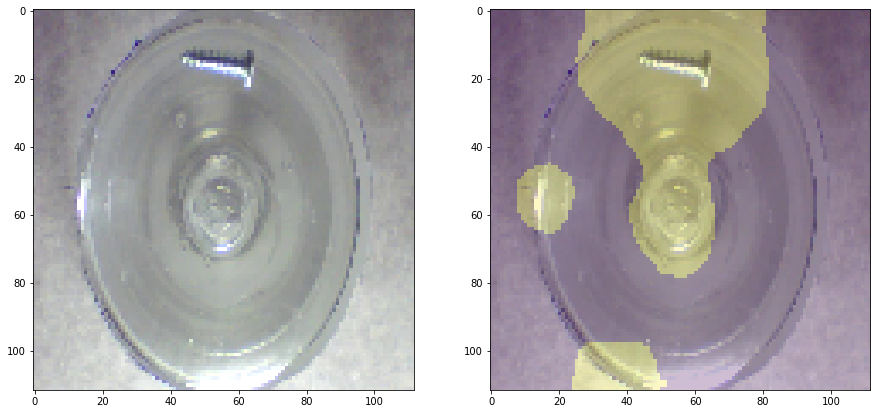

Threshold: 5217.81787109375 MaxValue: 87030.5703125
GT: scratch_neck, anomaly detected: True


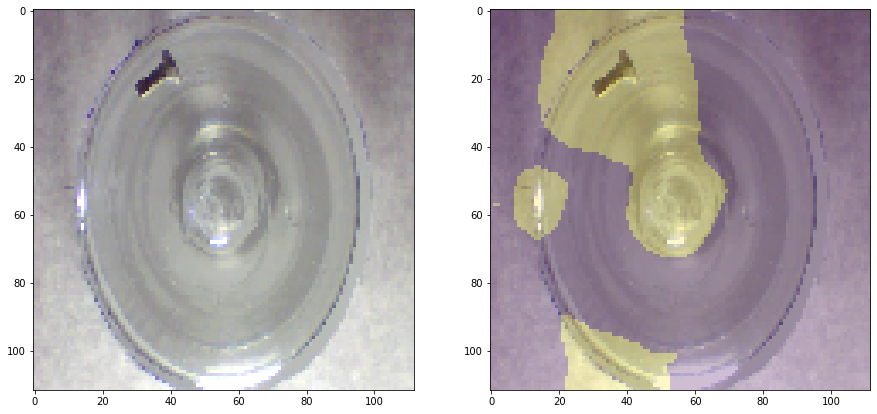

Threshold: 5217.81787109375 MaxValue: 47779.14453125
GT: manipulated_front, anomaly detected: True


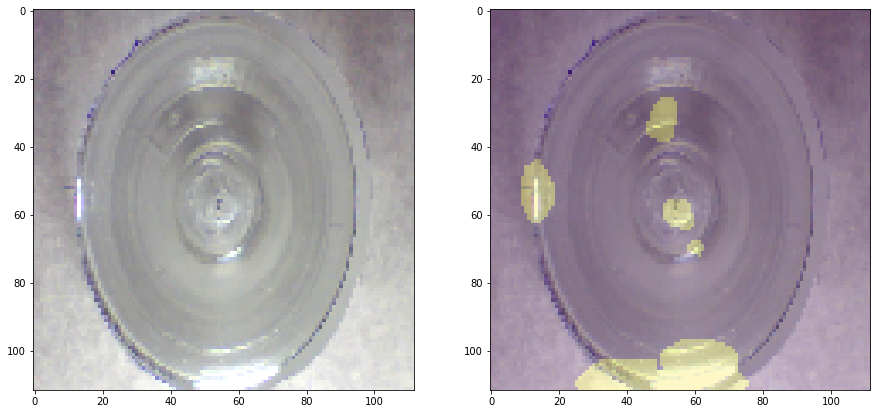

Threshold: 5217.81787109375 MaxValue: 8578.458984375
GT: thread_top, anomaly detected: True


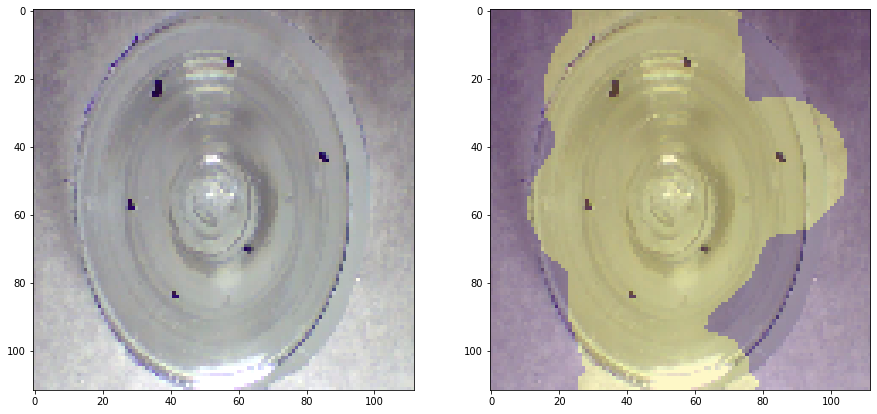

Threshold: 5217.81787109375 MaxValue: 87977.3671875
GT: thread_side, anomaly detected: True


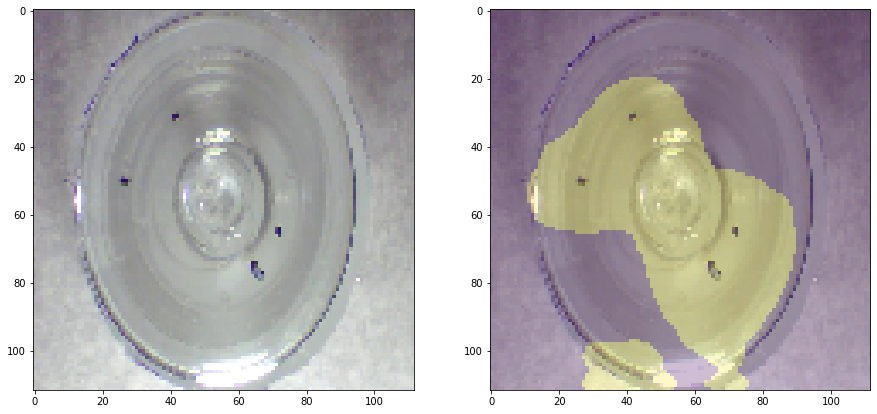

Threshold: 5217.81787109375 MaxValue: 83777.546875
GT: thread_side, anomaly detected: True


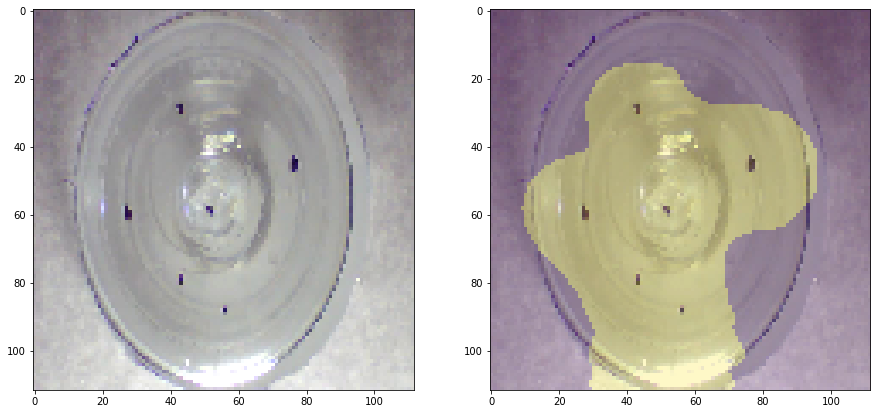

Threshold: 5217.81787109375 MaxValue: 90213.0390625
GT: thread_side, anomaly detected: True


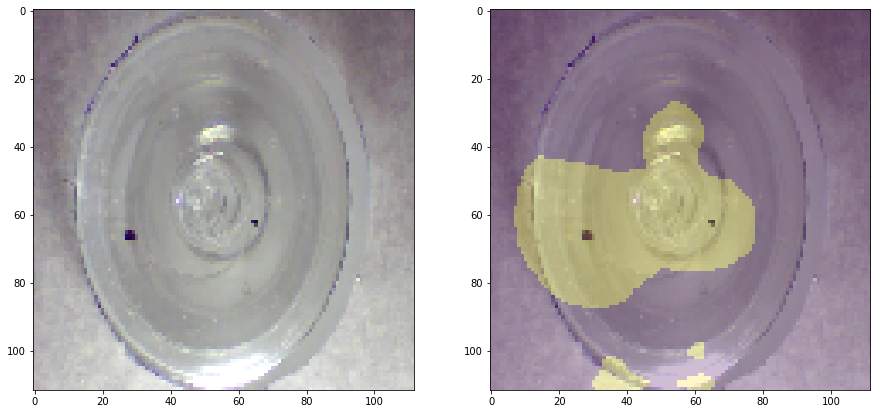

Threshold: 5217.81787109375 MaxValue: 92143.1015625
GT: thread_top, anomaly detected: True


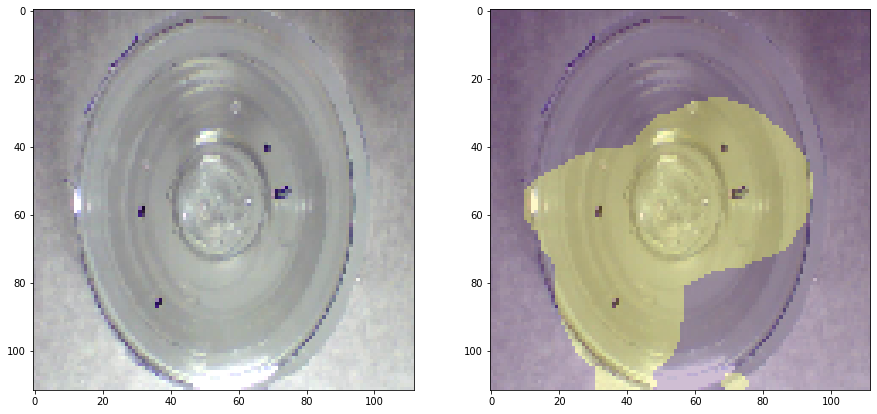

Threshold: 5217.81787109375 MaxValue: 75034.6953125
GT: thread_side, anomaly detected: True


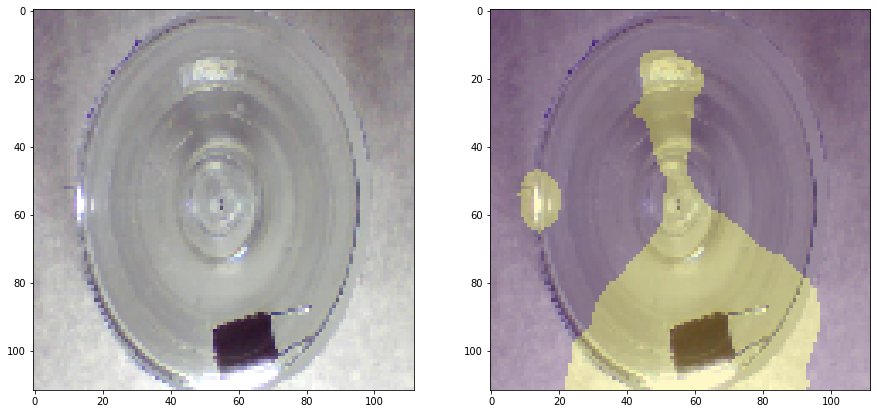

Threshold: 5217.81787109375 MaxValue: 172237.984375
GT: scratch_neck, anomaly detected: True


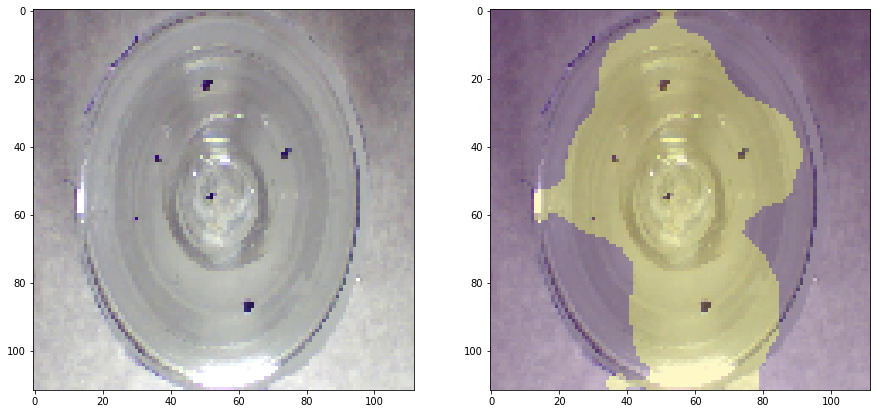

Threshold: 5217.81787109375 MaxValue: 150661.796875
GT: thread_top, anomaly detected: True


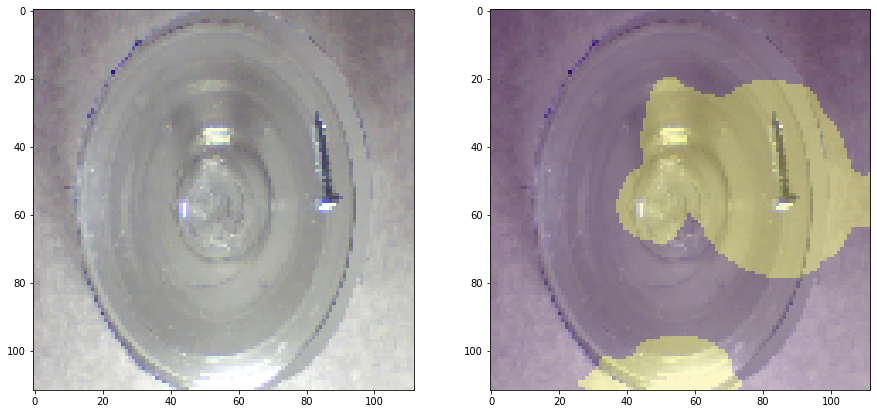

Threshold: 5217.81787109375 MaxValue: 73946.875
GT: manipulated_front, anomaly detected: True


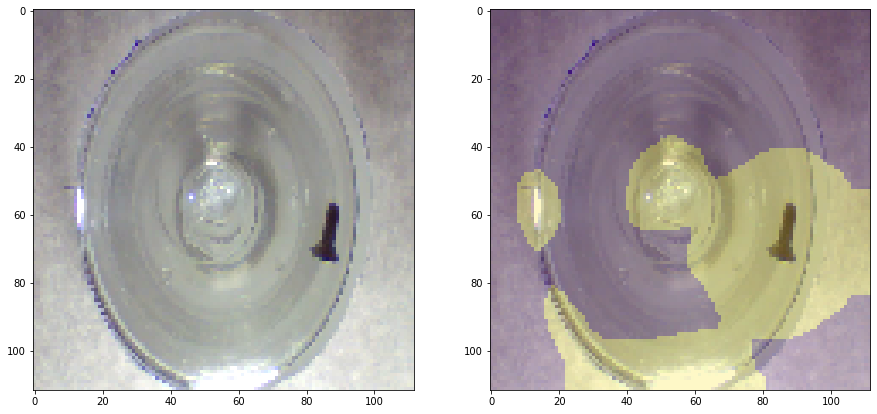

Threshold: 5217.81787109375 MaxValue: 99604.3046875
GT: manipulated_front, anomaly detected: True


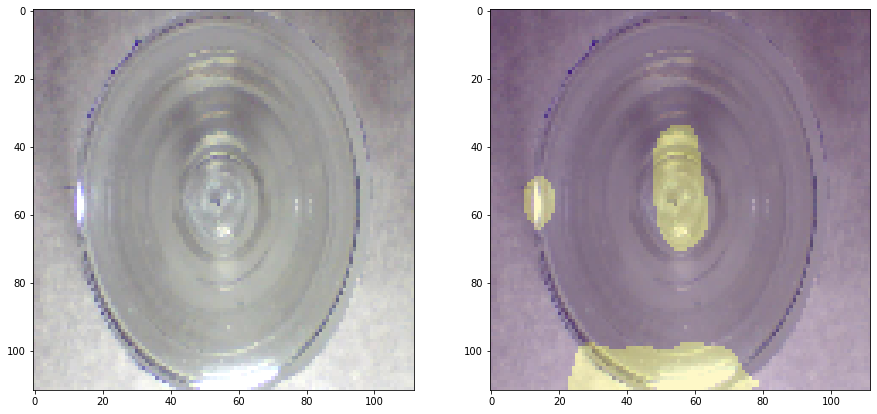

Threshold: 5217.81787109375 MaxValue: 11923.5166015625
GT: thread_top, anomaly detected: True


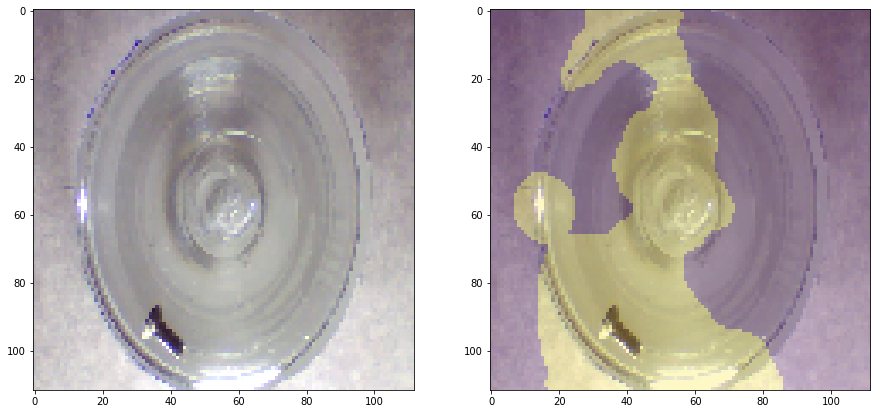

Threshold: 5217.81787109375 MaxValue: 100823.09375
GT: manipulated_front, anomaly detected: True


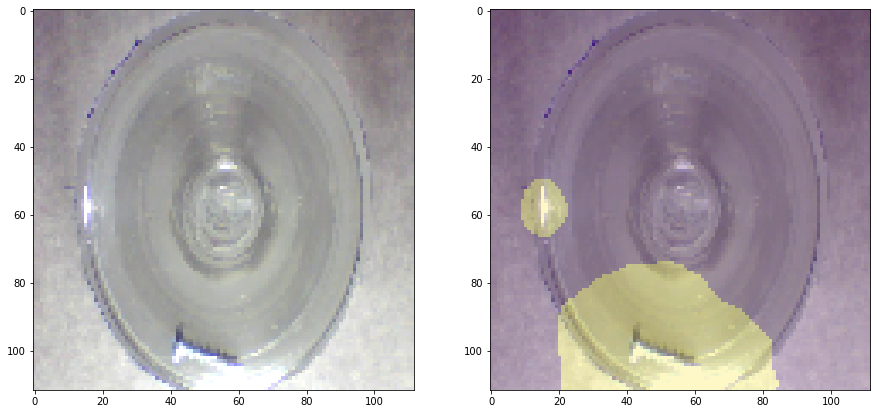

Threshold: 5217.81787109375 MaxValue: 85453.8828125
GT: scratch_head, anomaly detected: True


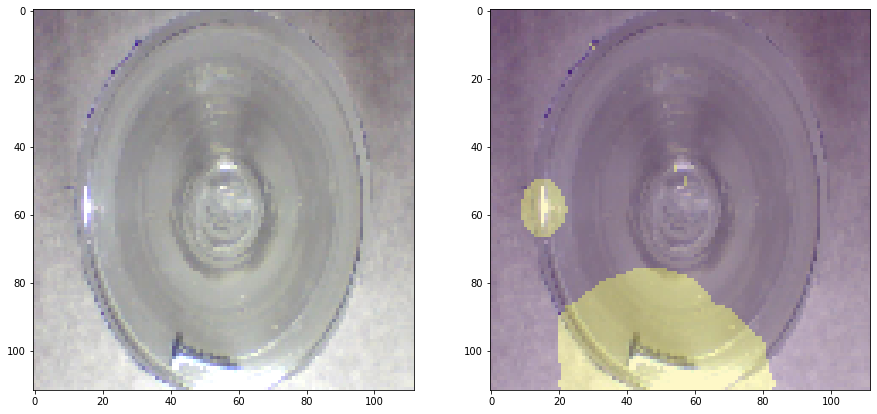

Threshold: 5217.81787109375 MaxValue: 87904.5625
GT: scratch_head, anomaly detected: True


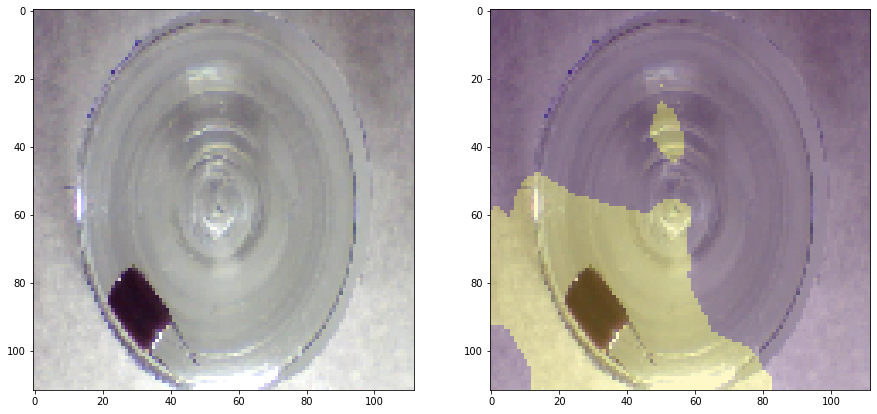

Threshold: 5217.81787109375 MaxValue: 125172.9453125
GT: scratch_neck, anomaly detected: True


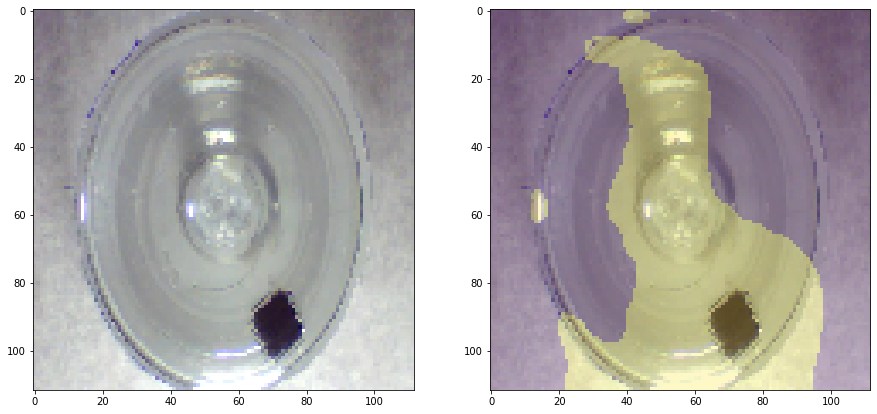

Threshold: 5217.81787109375 MaxValue: 149652.546875
GT: thread_top, anomaly detected: True


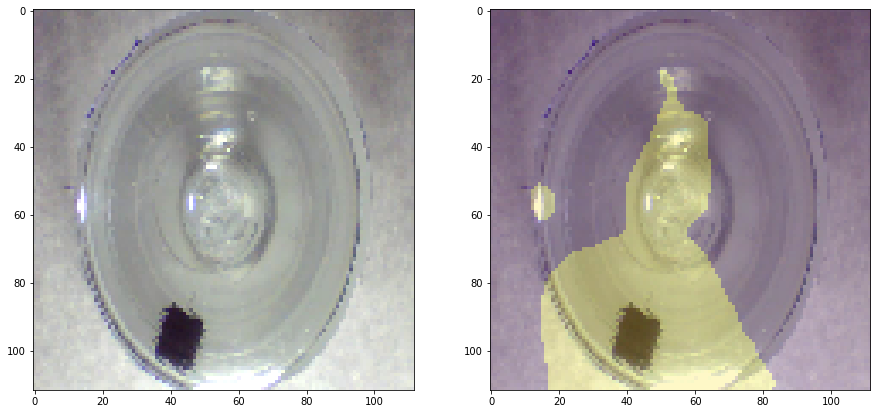

Threshold: 5217.81787109375 MaxValue: 136424.875
GT: scratch_neck, anomaly detected: True


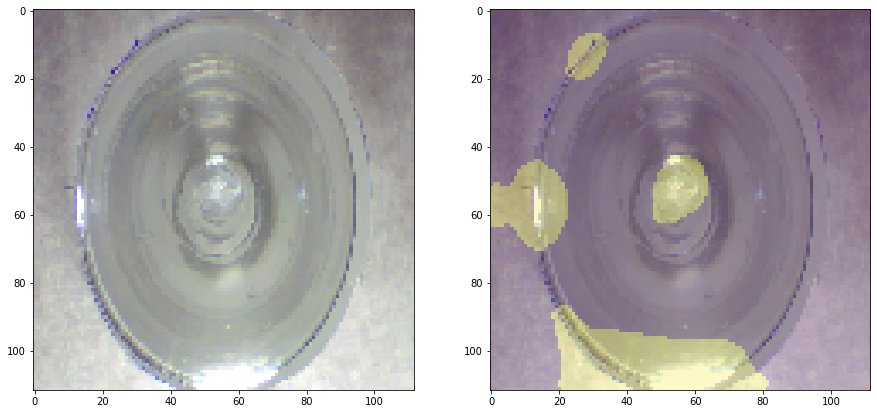

Threshold: 5217.81787109375 MaxValue: 16948.708984375
GT: good, anomaly detected: True


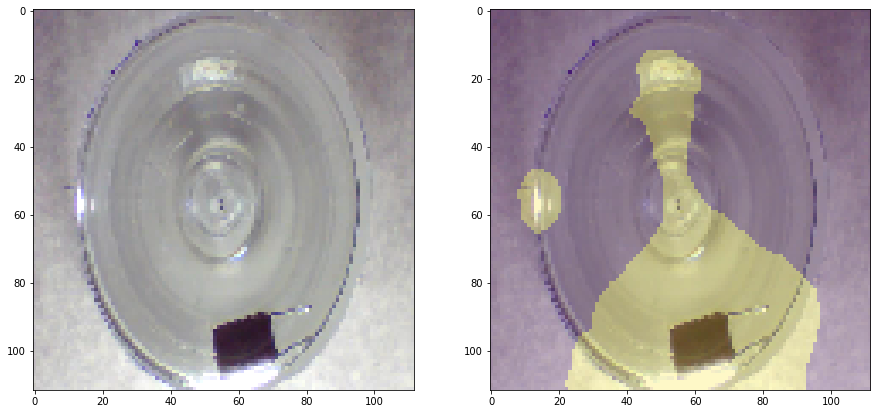

Threshold: 5217.81787109375 MaxValue: 172754.125
GT: scratch_neck, anomaly detected: True


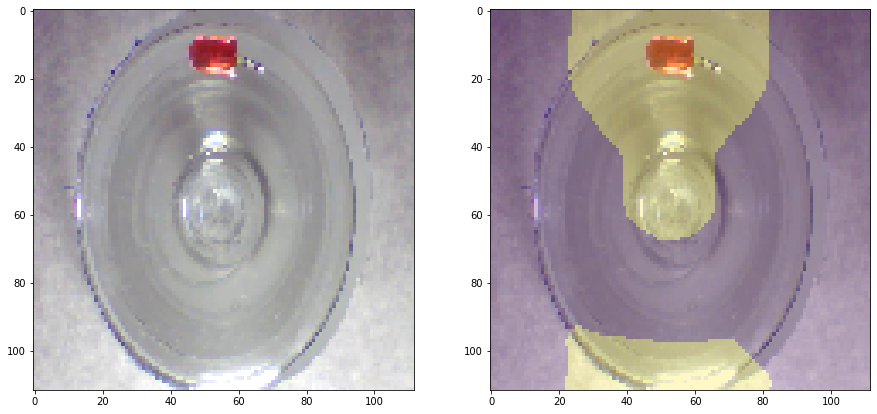

Threshold: 5217.81787109375 MaxValue: 166650.703125
GT: scratch_neck, anomaly detected: True


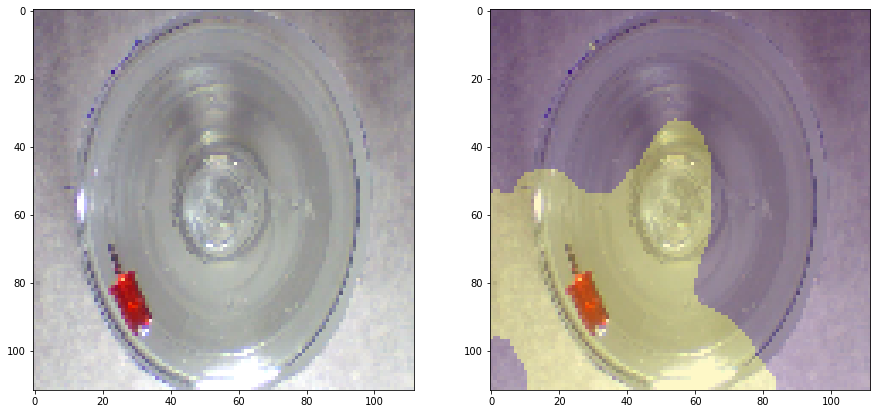

Threshold: 5217.81787109375 MaxValue: 212293.5
GT: thread_top, anomaly detected: True


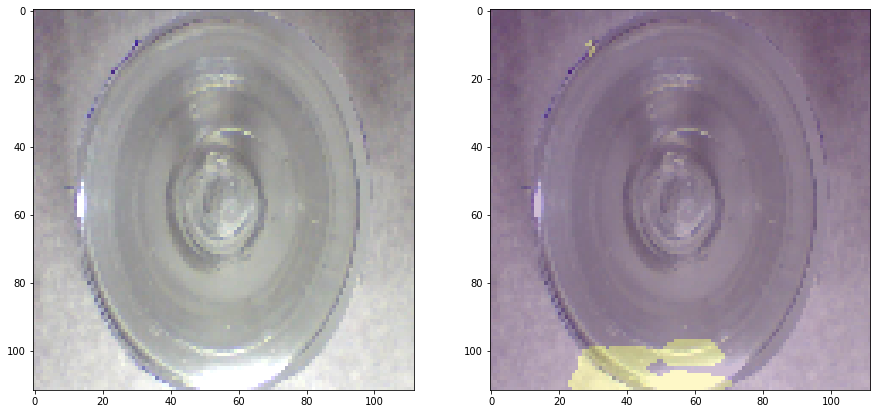

Threshold: 5217.81787109375 MaxValue: 9509.892578125
GT: good, anomaly detected: True


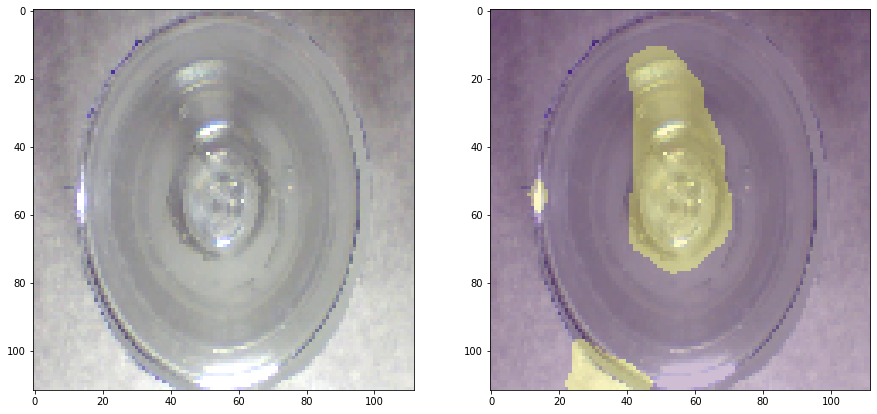

Threshold: 5217.81787109375 MaxValue: 13424.6572265625
GT: thread_top, anomaly detected: True


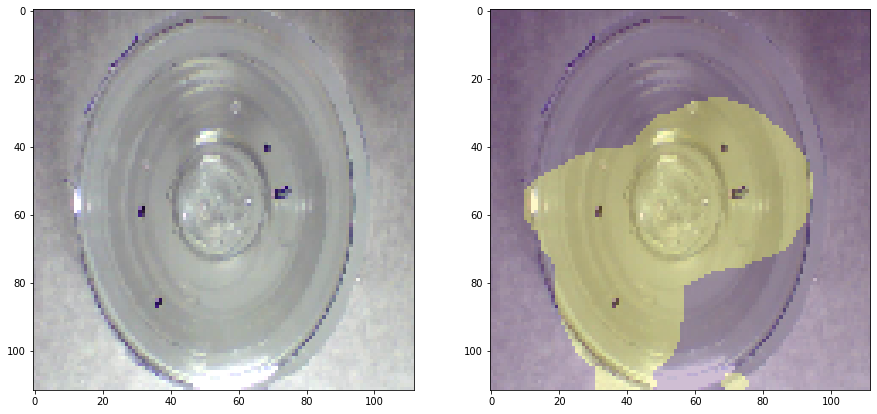

Threshold: 5217.81787109375 MaxValue: 75034.6953125
GT: thread_top, anomaly detected: True


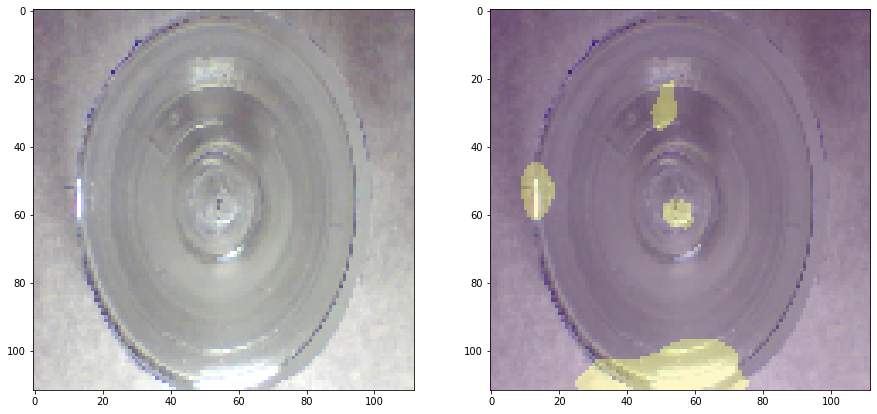

Threshold: 5217.81787109375 MaxValue: 8483.27734375
GT: good, anomaly detected: True


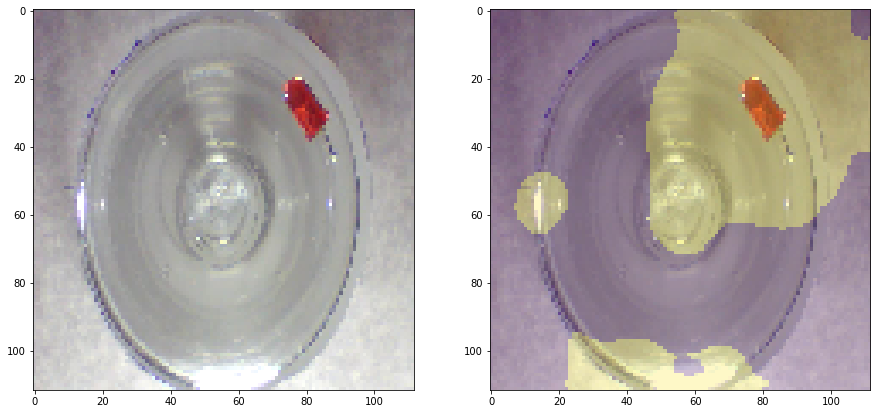

Threshold: 5217.81787109375 MaxValue: 168862.296875
GT: scratch_head, anomaly detected: True


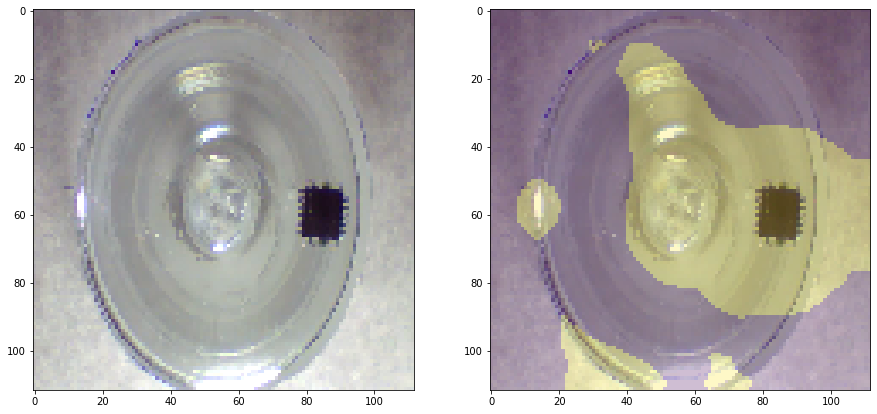

Threshold: 5217.81787109375 MaxValue: 119116.6328125
GT: thread_side, anomaly detected: True


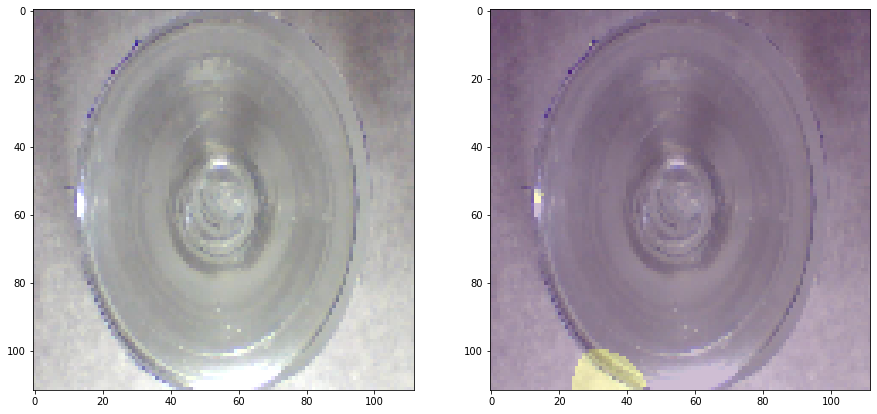

Threshold: 5217.81787109375 MaxValue: 9940.2333984375
GT: good, anomaly detected: True


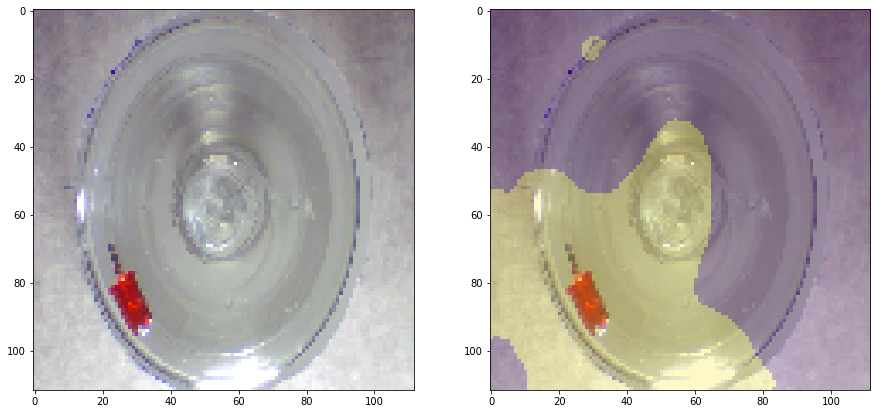

Threshold: 5217.81787109375 MaxValue: 211391.671875
GT: scratch_head, anomaly detected: True


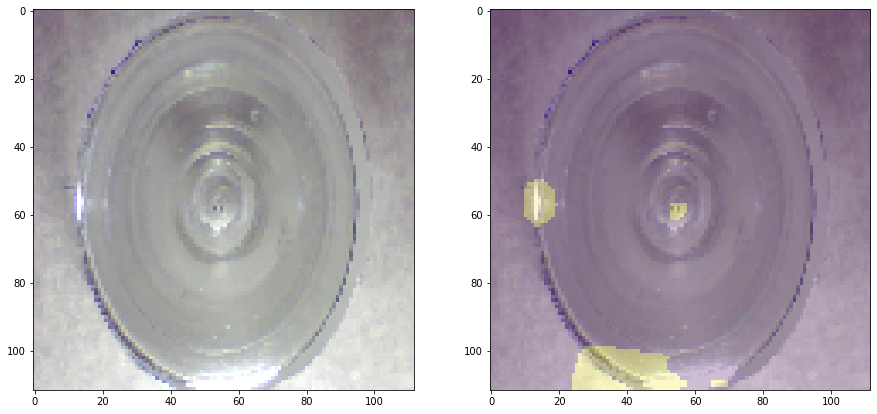

Threshold: 5217.81787109375 MaxValue: 10864.2939453125
GT: good, anomaly detected: True


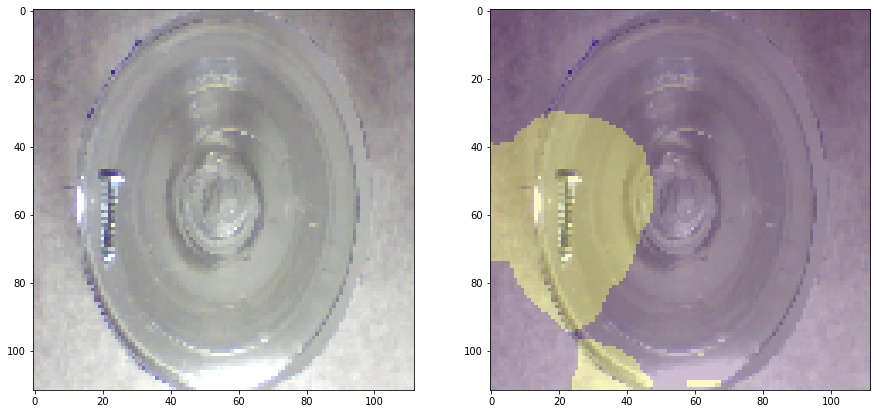

Threshold: 5217.81787109375 MaxValue: 49561.06640625
GT: manipulated_front, anomaly detected: True


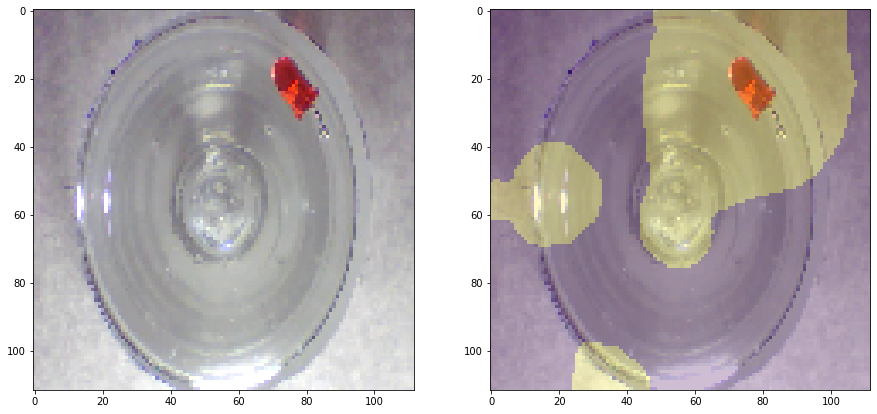

Threshold: 5217.81787109375 MaxValue: 203759.46875
GT: scratch_neck, anomaly detected: True


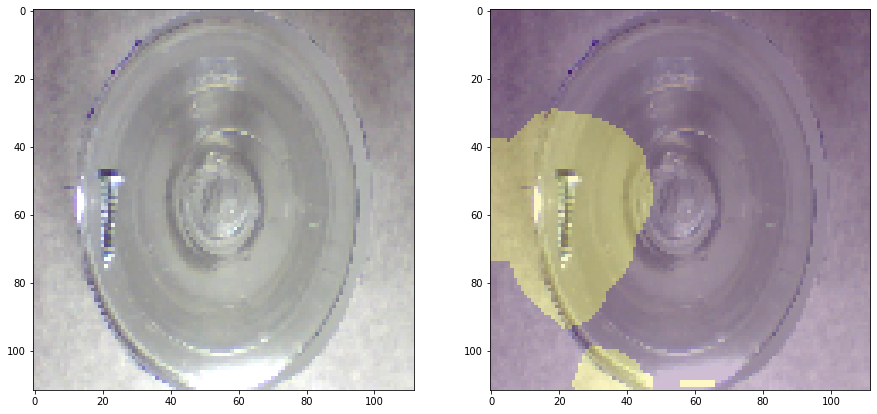

Threshold: 5217.81787109375 MaxValue: 51077.41015625
GT: scratch_neck, anomaly detected: True


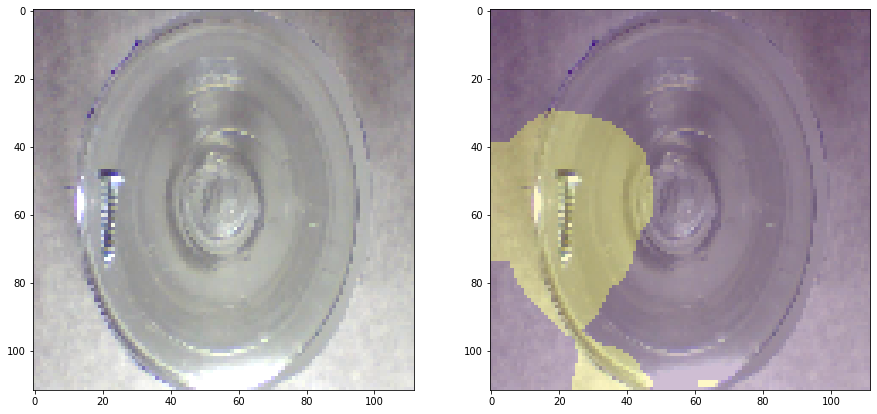

Threshold: 5217.81787109375 MaxValue: 51014.67578125
GT: scratch_neck, anomaly detected: True


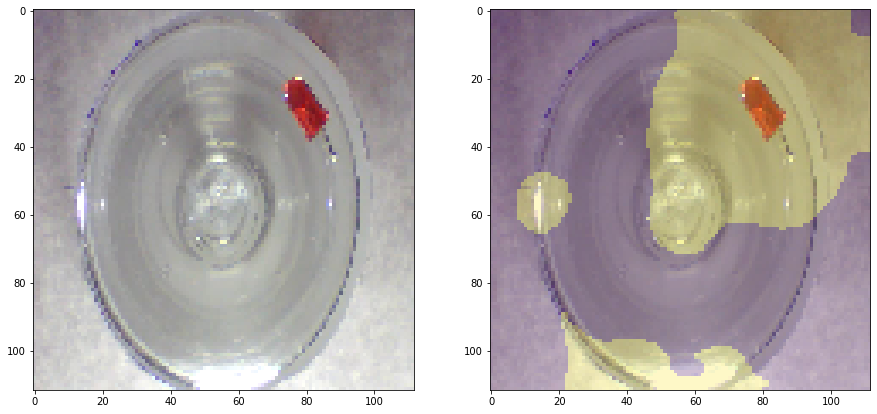

Threshold: 5217.81787109375 MaxValue: 167370.421875
GT: scratch_neck, anomaly detected: True


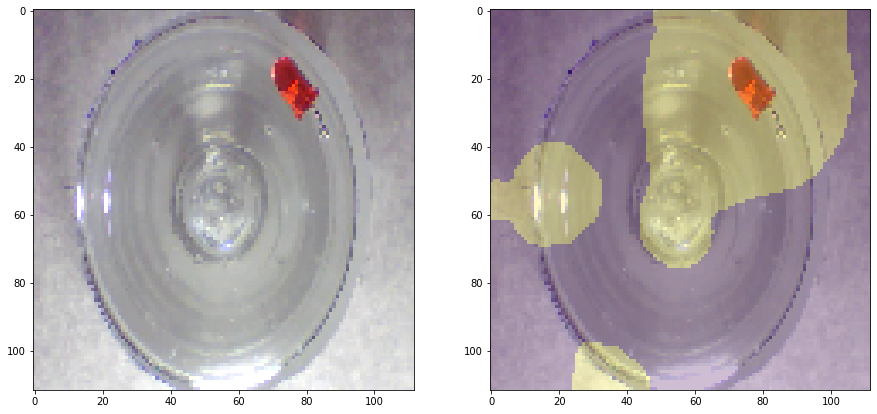

Threshold: 5217.81787109375 MaxValue: 203759.46875
GT: scratch_head, anomaly detected: True


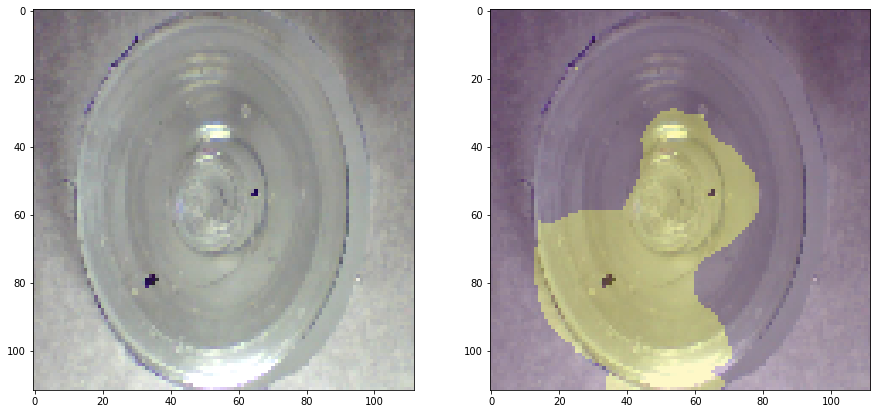

Threshold: 5217.81787109375 MaxValue: 108768.875
GT: thread_side, anomaly detected: True


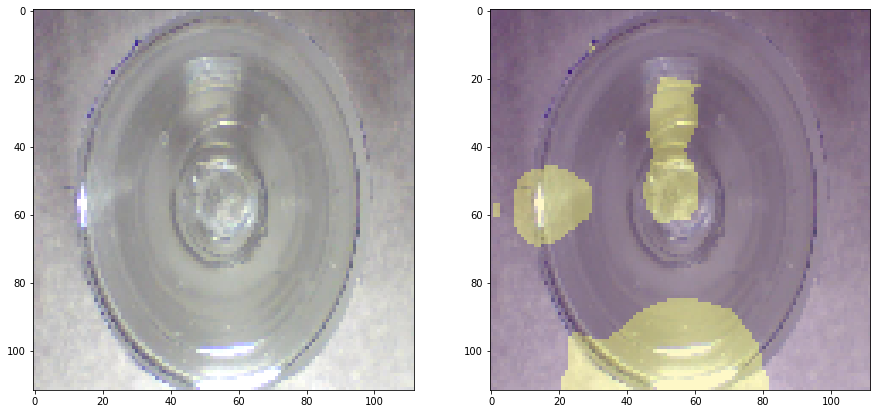

Threshold: 5217.81787109375 MaxValue: 21024.705078125
GT: thread_top, anomaly detected: True


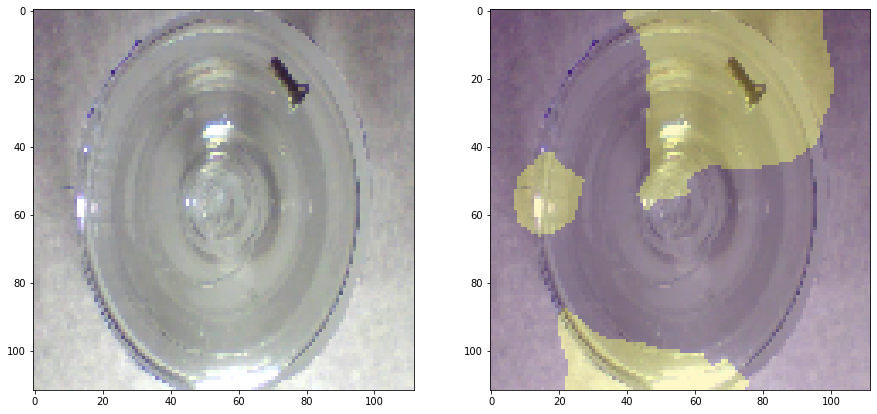

Threshold: 5217.81787109375 MaxValue: 70921.234375
GT: thread_top, anomaly detected: True


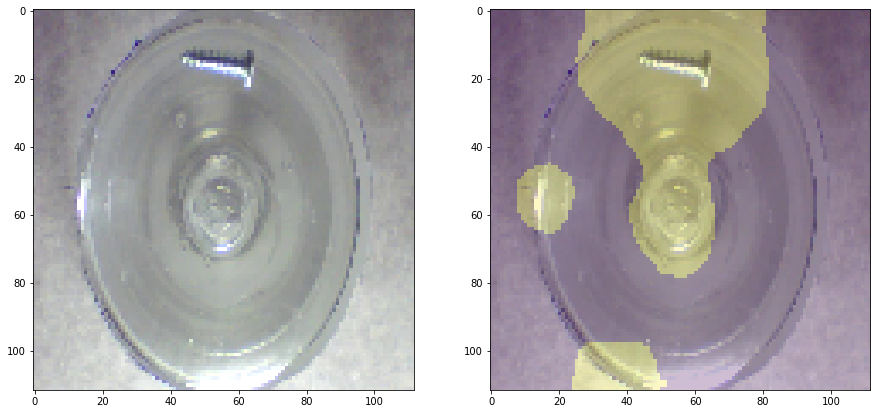

Threshold: 5217.81787109375 MaxValue: 87030.5703125
GT: manipulated_front, anomaly detected: True


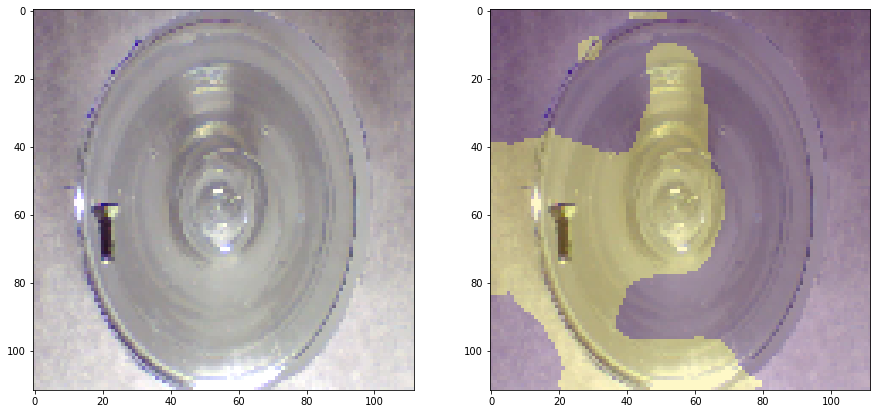

Threshold: 5217.81787109375 MaxValue: 66224.1015625
GT: manipulated_front, anomaly detected: True


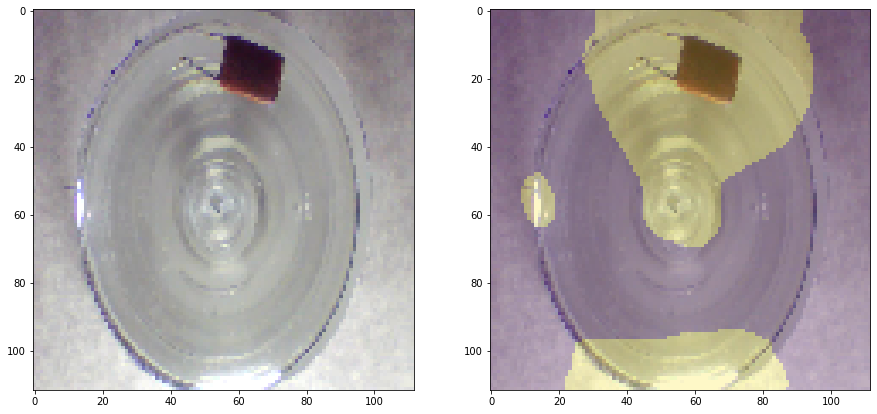

Threshold: 5217.81787109375 MaxValue: 133684.828125
GT: scratch_neck, anomaly detected: True


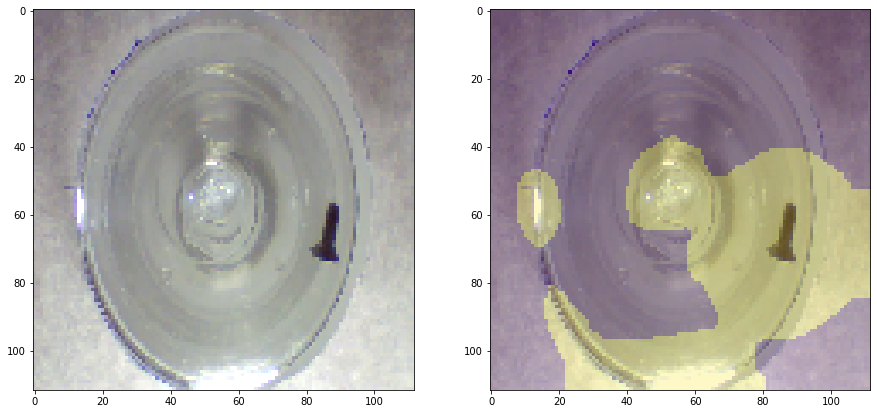

Threshold: 5217.81787109375 MaxValue: 98457.4375
GT: manipulated_front, anomaly detected: True


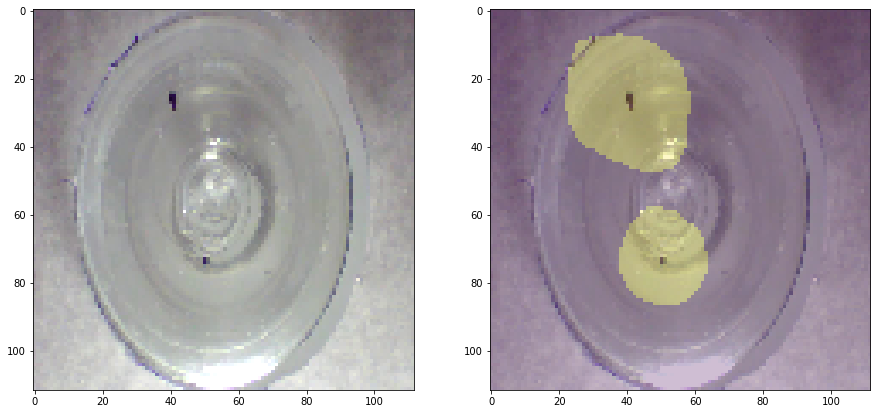

Threshold: 5217.81787109375 MaxValue: 52820.265625
GT: thread_side, anomaly detected: True


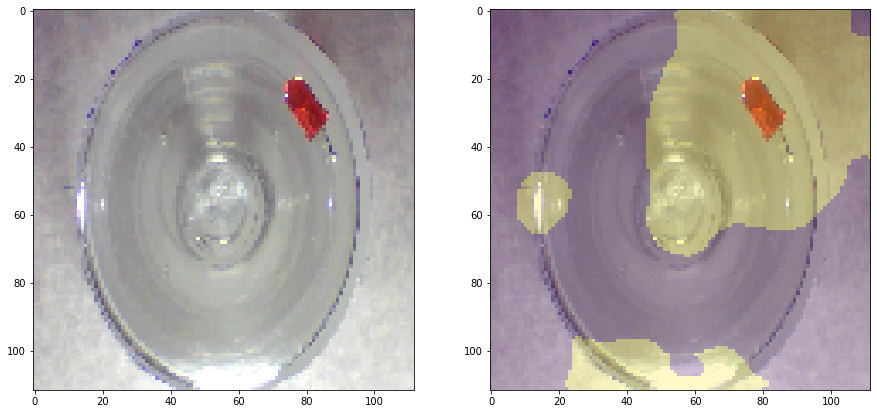

Threshold: 5217.81787109375 MaxValue: 170366.125
GT: scratch_head, anomaly detected: True


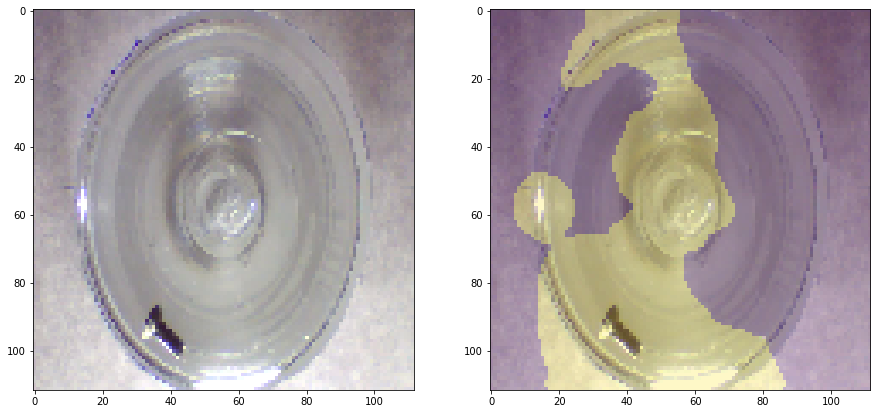

Threshold: 5217.81787109375 MaxValue: 99374.875
GT: manipulated_front, anomaly detected: True


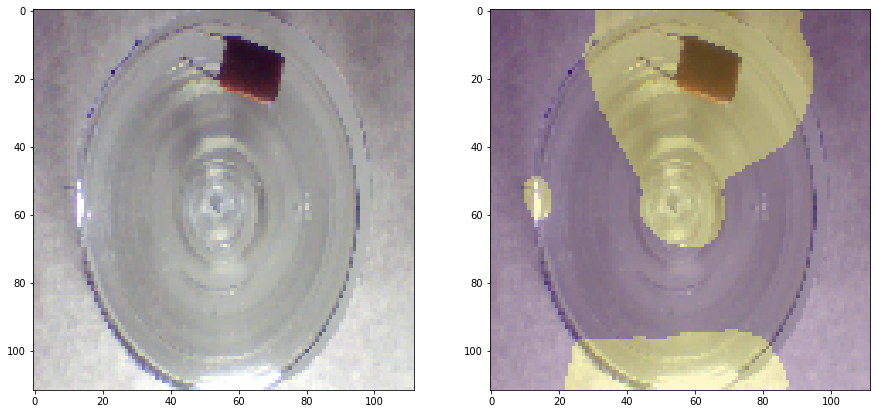

Threshold: 5217.81787109375 MaxValue: 133345.421875
GT: scratch_neck, anomaly detected: True


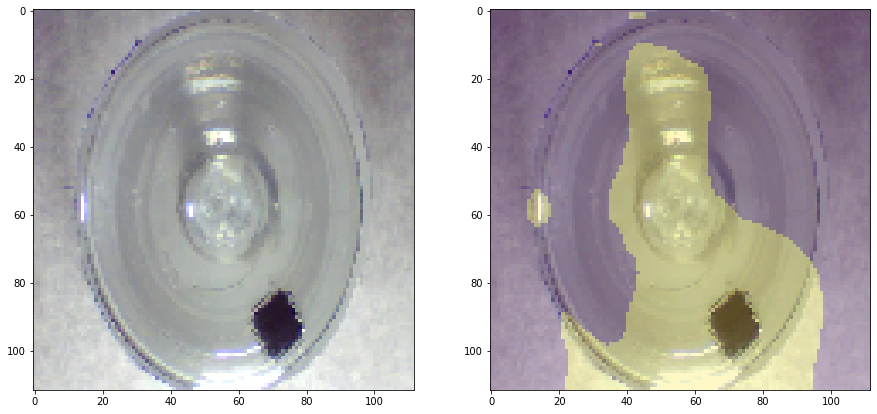

Threshold: 5217.81787109375 MaxValue: 147437.984375
GT: thread_side, anomaly detected: True


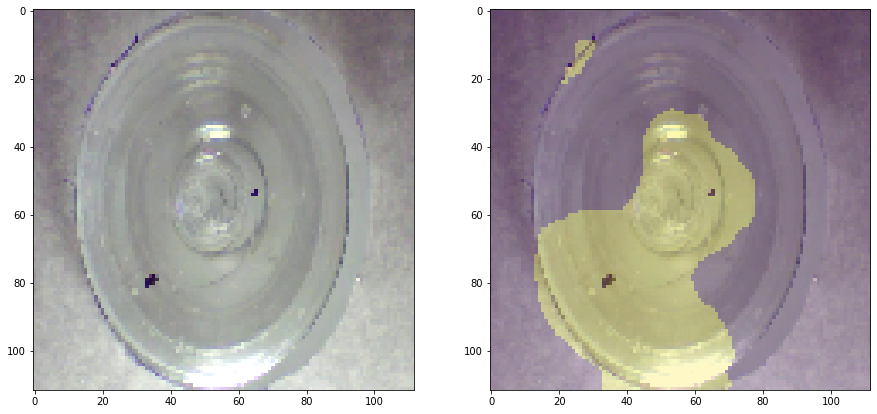

Threshold: 5217.81787109375 MaxValue: 105423.359375
GT: thread_side, anomaly detected: True


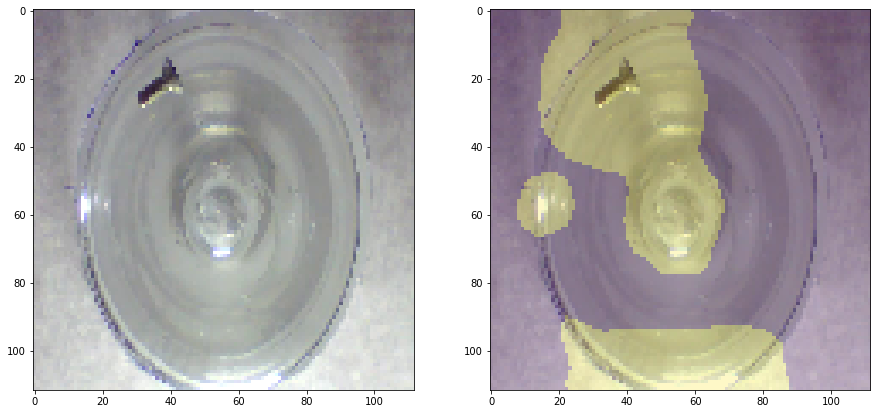

Threshold: 5217.81787109375 MaxValue: 51872.1484375
GT: scratch_head, anomaly detected: True


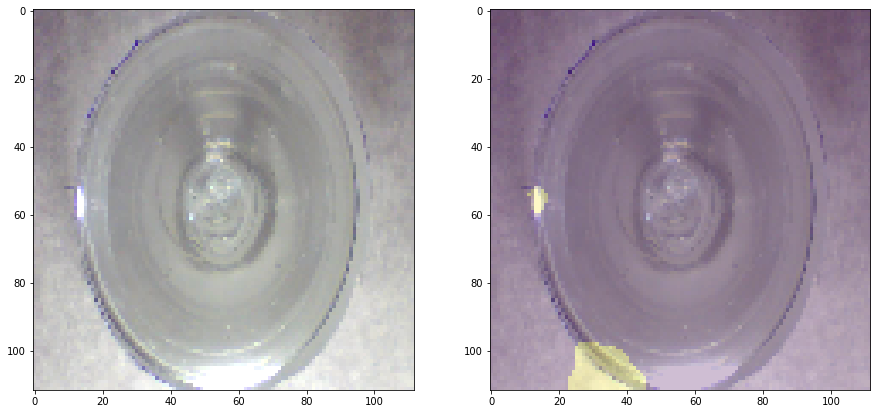

Threshold: 5217.81787109375 MaxValue: 10657.3046875
GT: thread_top, anomaly detected: True


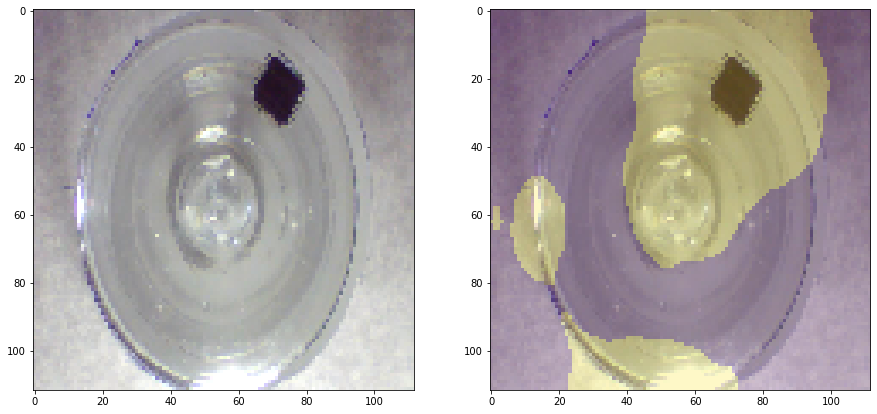

Threshold: 5217.81787109375 MaxValue: 115587.6640625
GT: thread_side, anomaly detected: True


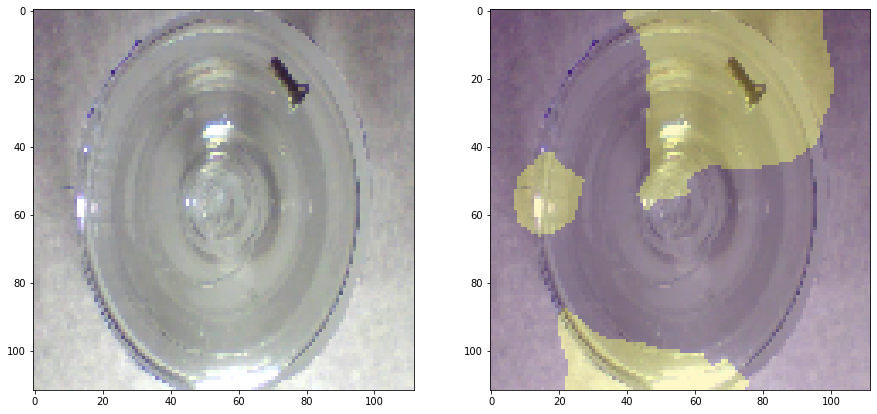

Threshold: 5217.81787109375 MaxValue: 70921.234375
GT: manipulated_front, anomaly detected: True


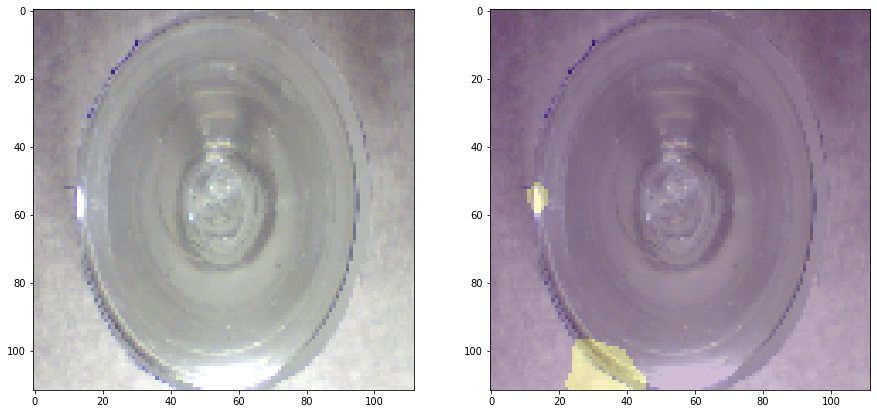

Threshold: 5217.81787109375 MaxValue: 11138.65625
GT: good, anomaly detected: True


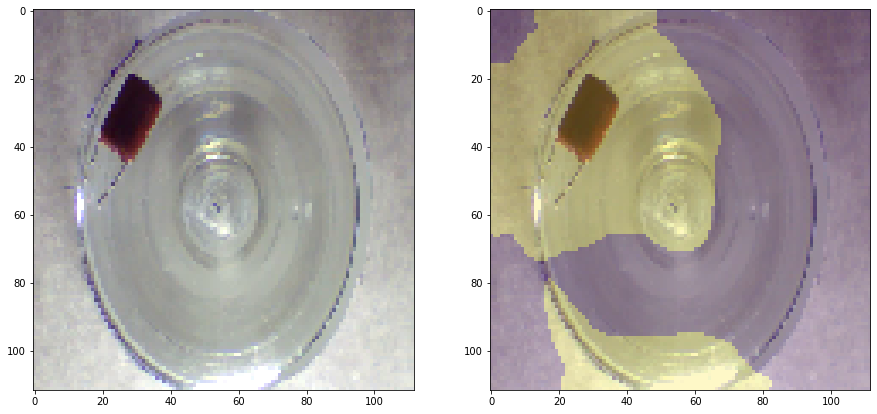

Threshold: 5217.81787109375 MaxValue: 116946.4375
GT: thread_top, anomaly detected: True


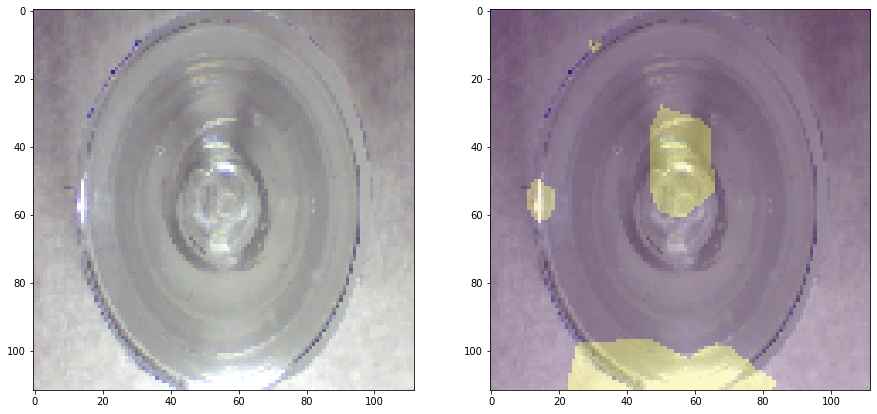

Threshold: 5217.81787109375 MaxValue: 13877.3310546875
GT: thread_top, anomaly detected: True


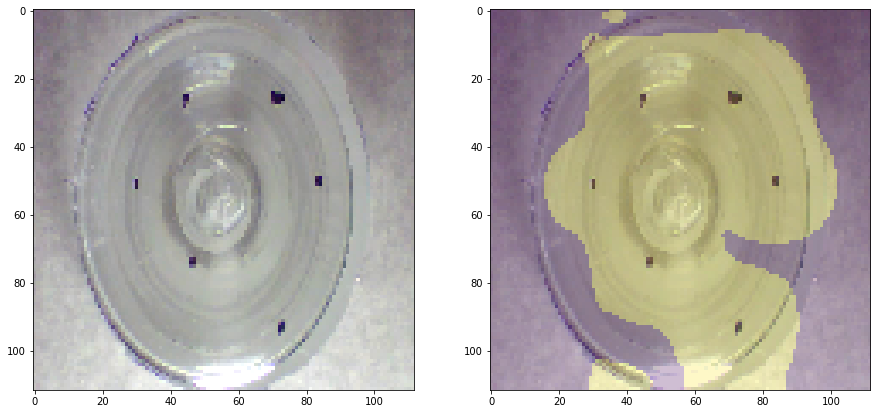

Threshold: 5217.81787109375 MaxValue: 137779.96875
GT: thread_side, anomaly detected: True


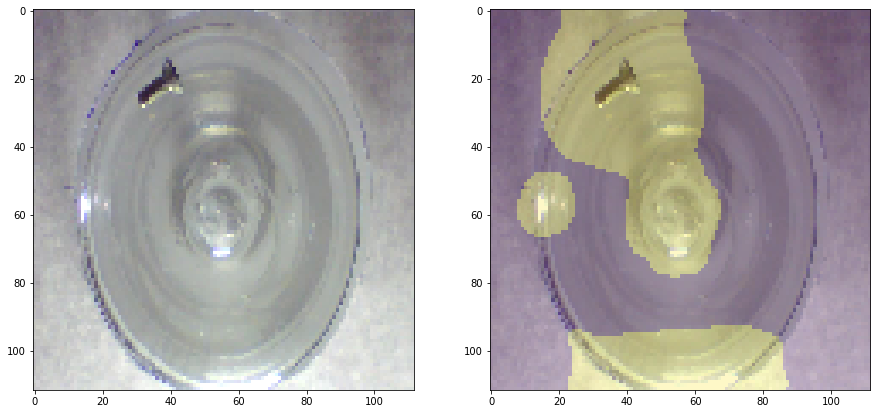

Threshold: 5217.81787109375 MaxValue: 50357.703125
GT: scratch_head, anomaly detected: True


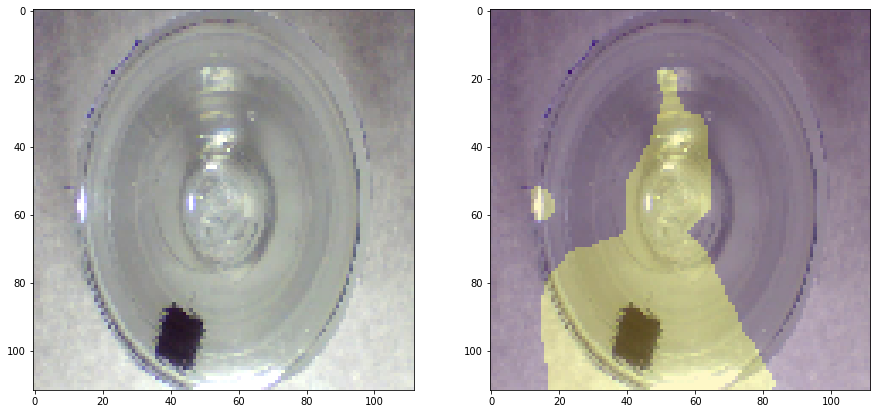

Threshold: 5217.81787109375 MaxValue: 137035.125
GT: scratch_neck, anomaly detected: True


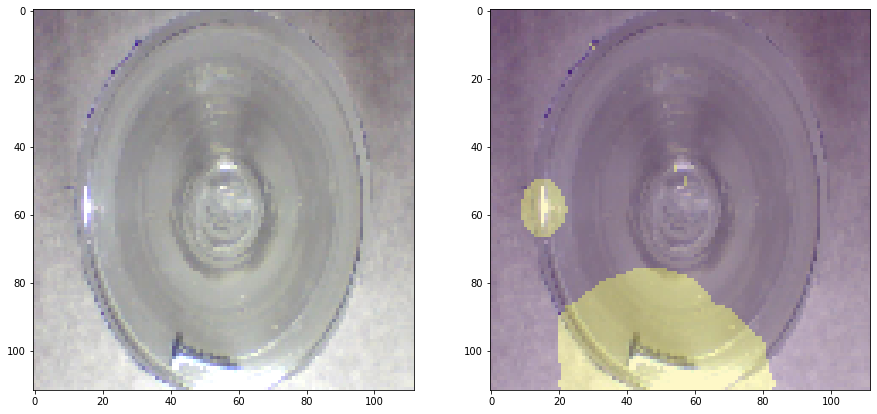

Threshold: 5217.81787109375 MaxValue: 87904.5625
GT: scratch_neck, anomaly detected: True


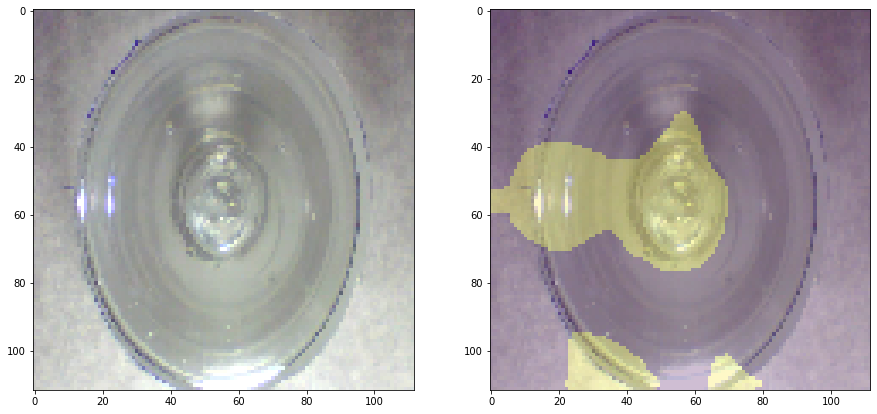

Threshold: 5217.81787109375 MaxValue: 20013.48828125
GT: good, anomaly detected: True


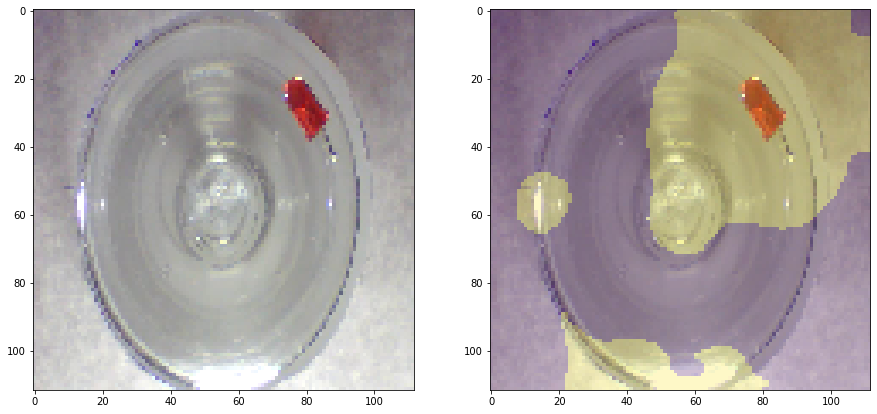

Threshold: 5217.81787109375 MaxValue: 167370.421875
GT: scratch_head, anomaly detected: True


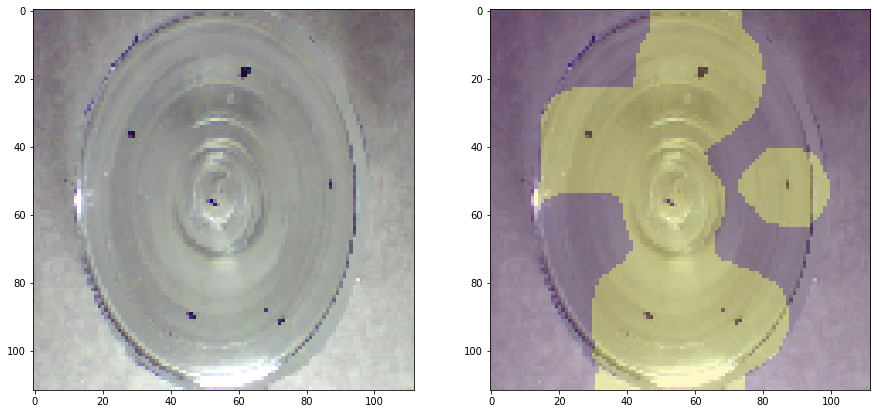

Threshold: 5217.81787109375 MaxValue: 90837.765625
GT: thread_side, anomaly detected: True


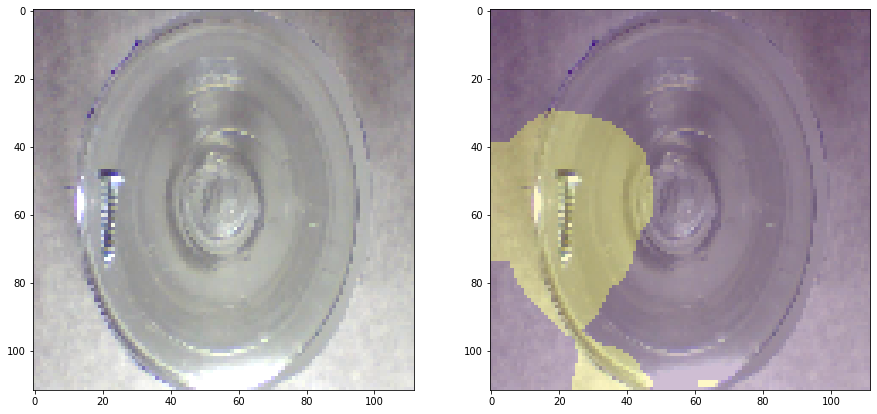

Threshold: 5217.81787109375 MaxValue: 51014.67578125
GT: manipulated_front, anomaly detected: True


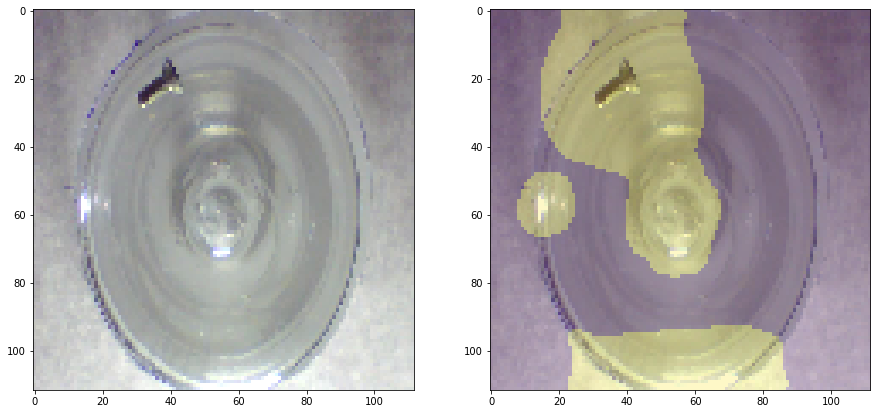

Threshold: 5217.81787109375 MaxValue: 50357.703125
GT: manipulated_front, anomaly detected: True


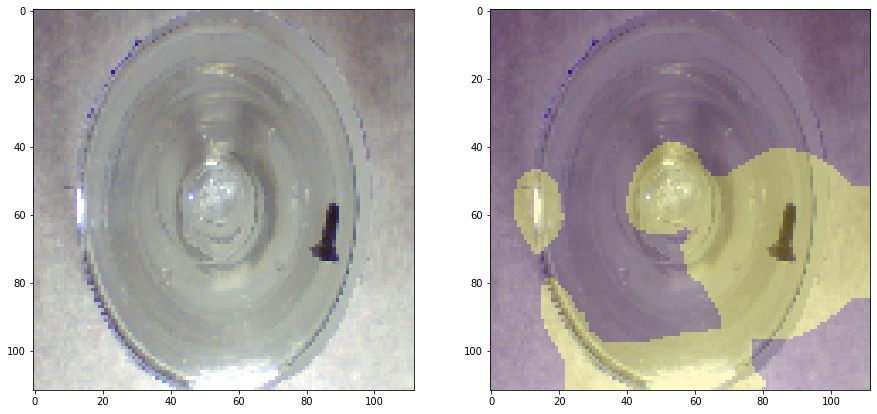

Threshold: 5217.81787109375 MaxValue: 98921.734375
GT: manipulated_front, anomaly detected: True


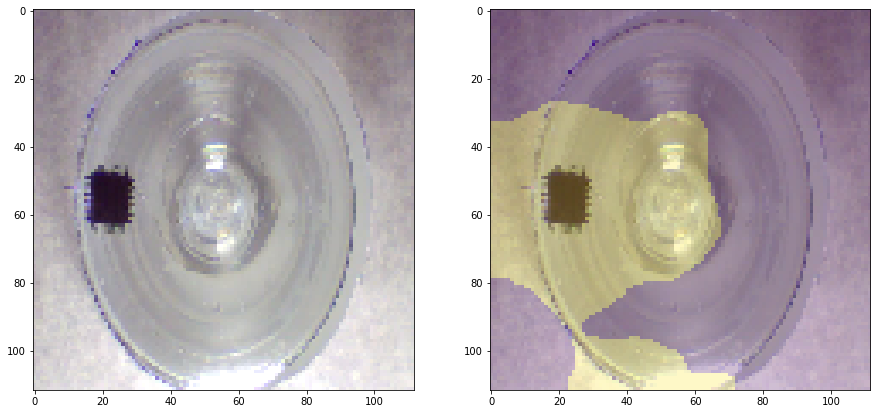

Threshold: 5217.81787109375 MaxValue: 120854.9609375
GT: scratch_neck, anomaly detected: True


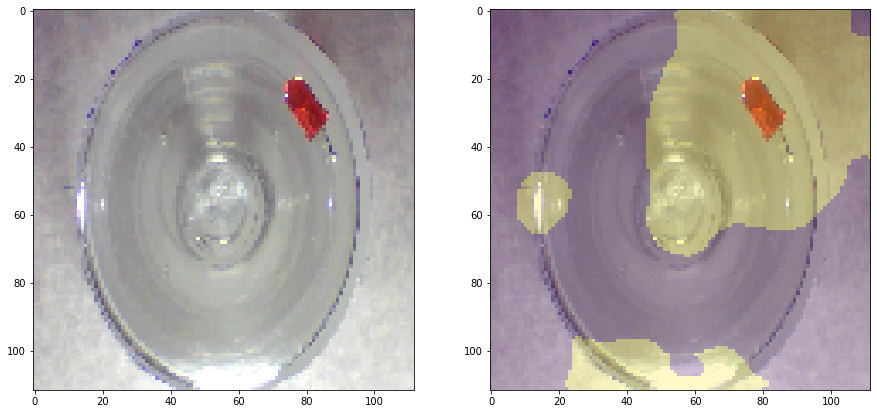

Threshold: 5217.81787109375 MaxValue: 170366.125
GT: scratch_neck, anomaly detected: True


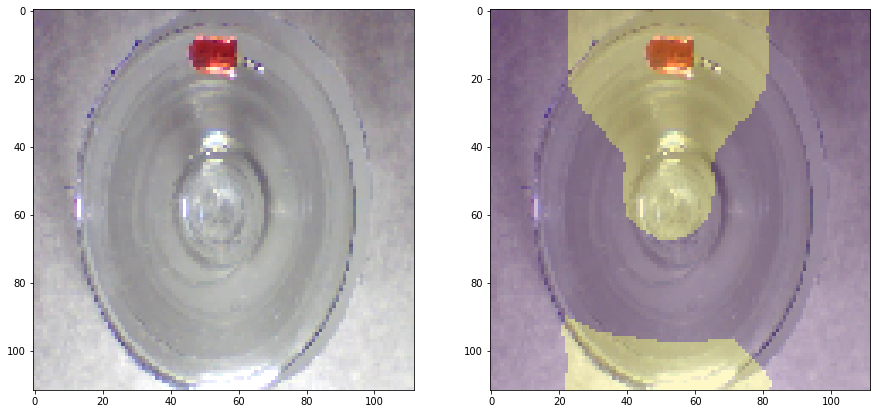

Threshold: 5217.81787109375 MaxValue: 165835.53125
GT: scratch_neck, anomaly detected: True


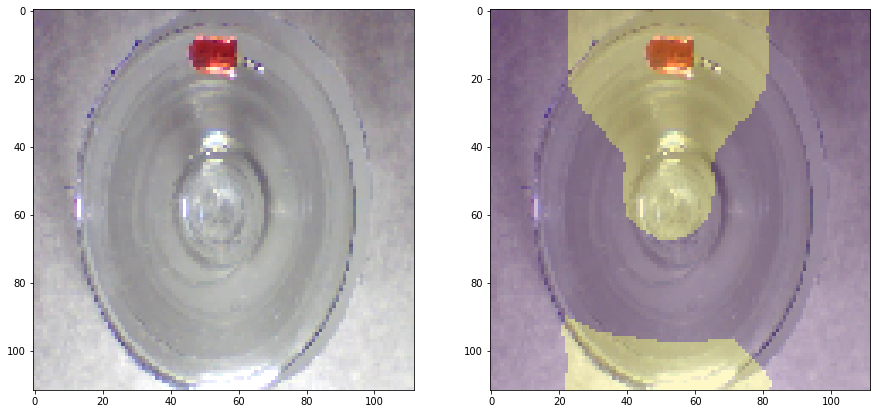

Threshold: 5217.81787109375 MaxValue: 165835.53125
GT: scratch_head, anomaly detected: True


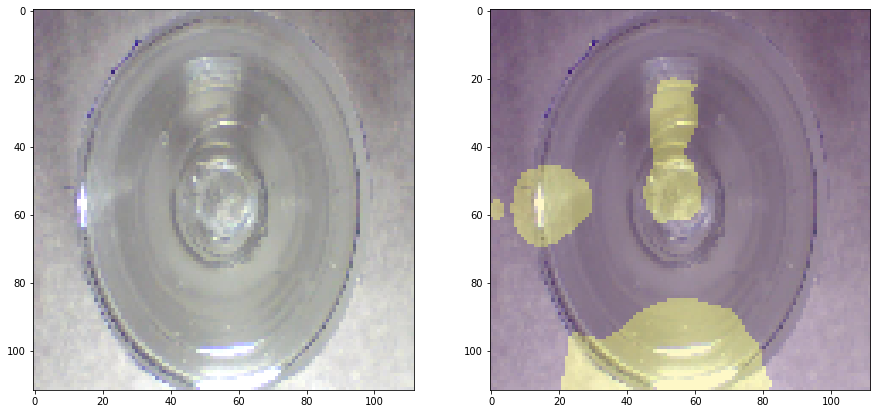

Threshold: 5217.81787109375 MaxValue: 21219.078125
GT: good, anomaly detected: True


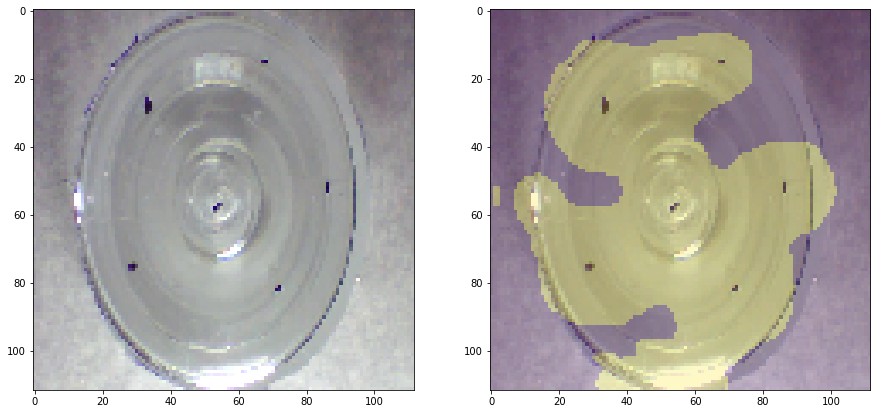

Threshold: 5217.81787109375 MaxValue: 60569.484375
GT: thread_side, anomaly detected: True


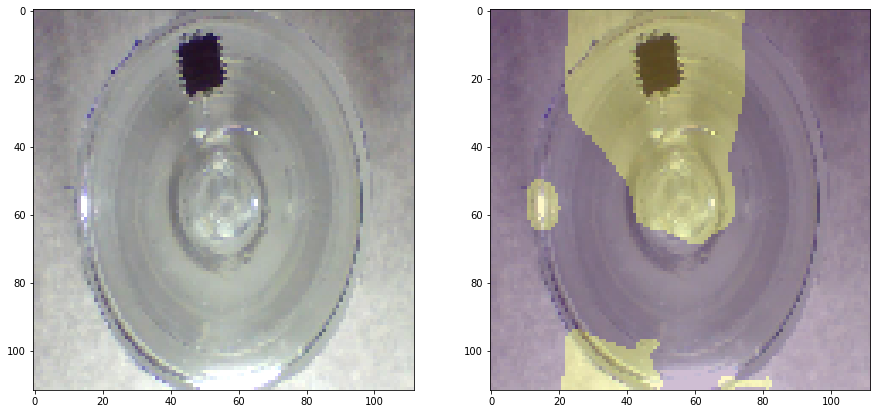

Threshold: 5217.81787109375 MaxValue: 125371.65625
GT: scratch_neck, anomaly detected: True


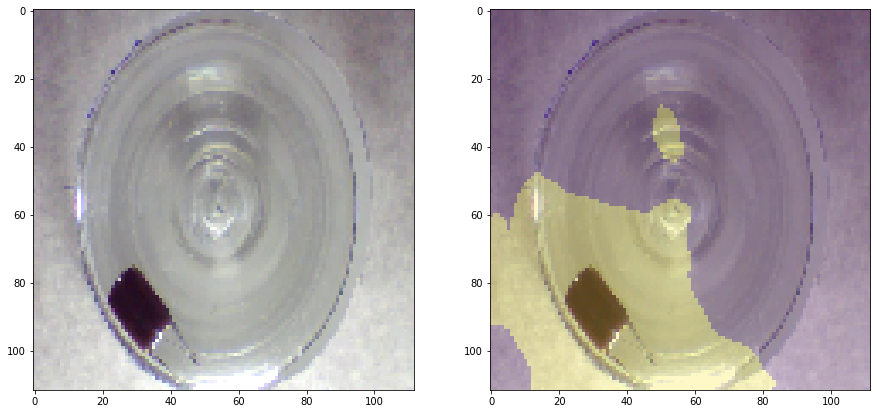

Threshold: 5217.81787109375 MaxValue: 126914.125
GT: scratch_neck, anomaly detected: True


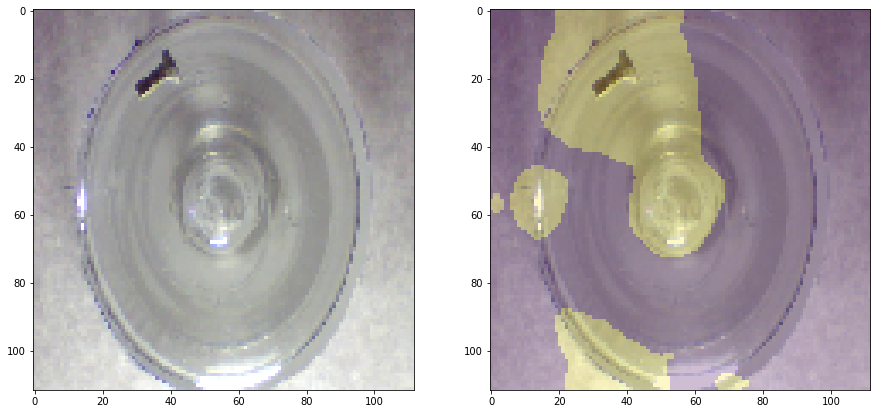

Threshold: 5217.81787109375 MaxValue: 50901.375
GT: manipulated_front, anomaly detected: True


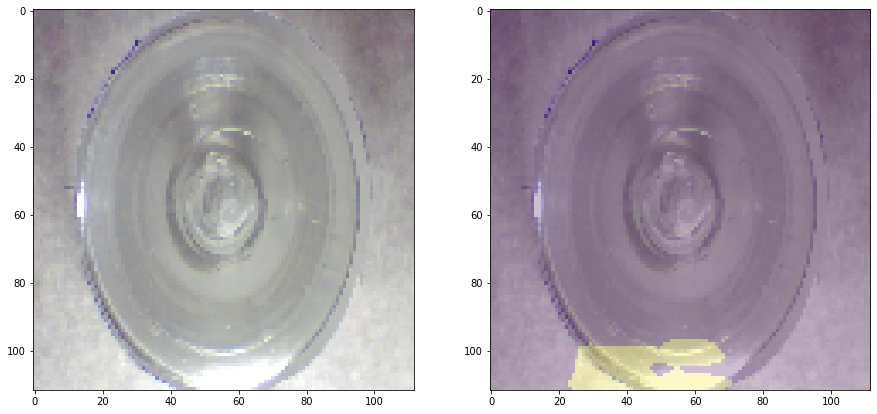

Threshold: 5217.81787109375 MaxValue: 10066.2587890625
GT: thread_top, anomaly detected: True


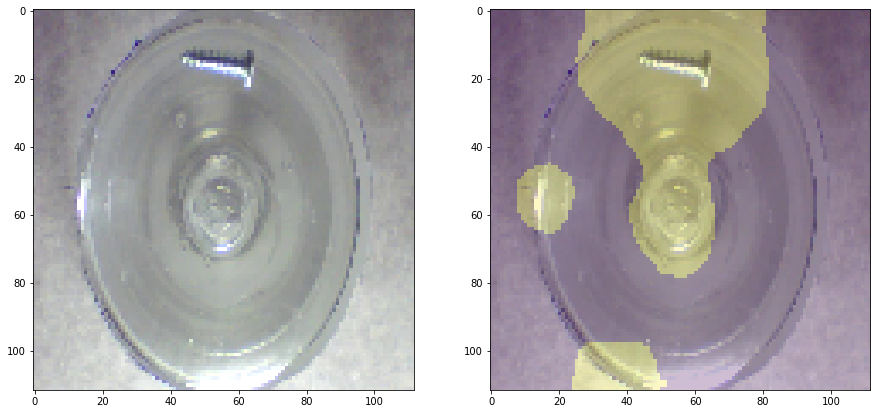

Threshold: 5217.81787109375 MaxValue: 87030.5703125
GT: scratch_head, anomaly detected: True


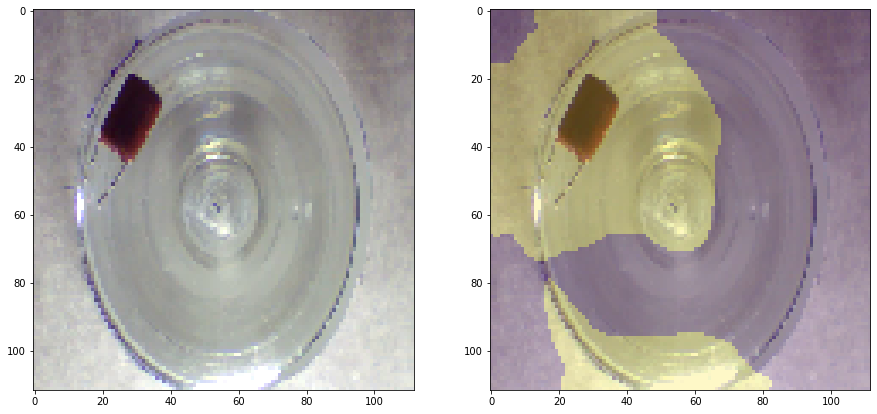

Threshold: 5217.81787109375 MaxValue: 116946.4375
GT: scratch_neck, anomaly detected: True


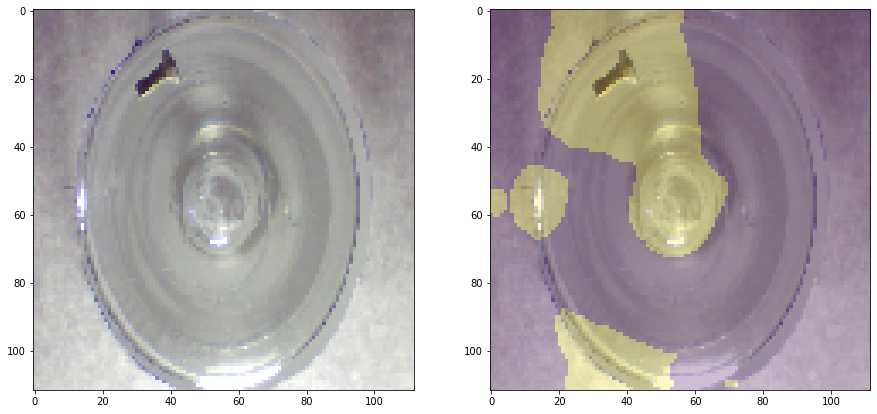

Threshold: 5217.81787109375 MaxValue: 49189.24609375
GT: manipulated_front, anomaly detected: True


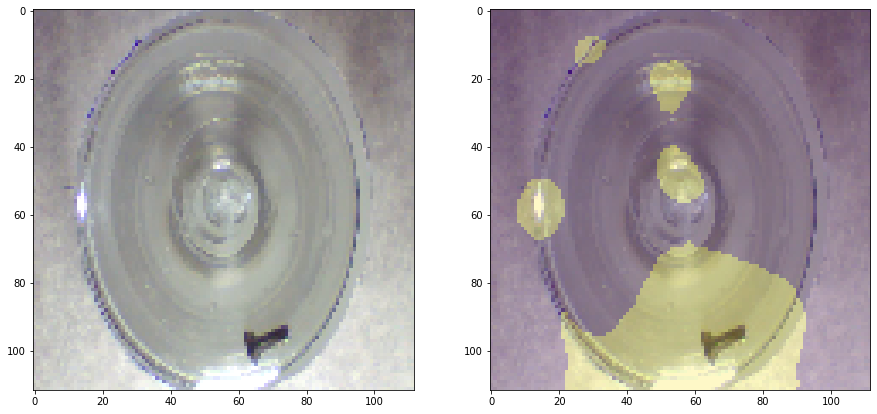

Threshold: 5217.81787109375 MaxValue: 109296.6640625
GT: manipulated_front, anomaly detected: True


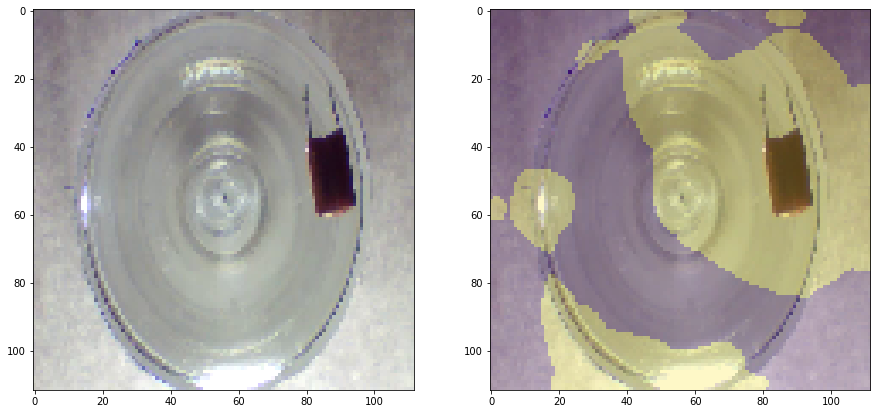

Threshold: 5217.81787109375 MaxValue: 130461.03125
GT: scratch_neck, anomaly detected: True


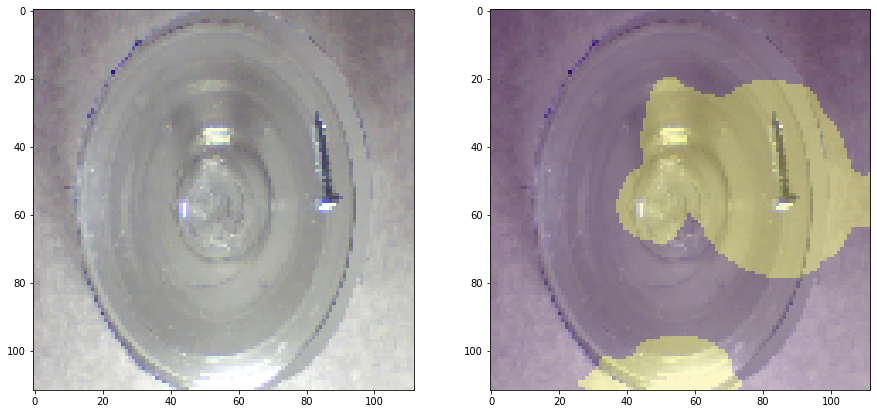

Threshold: 5217.81787109375 MaxValue: 73946.875
GT: scratch_head, anomaly detected: True


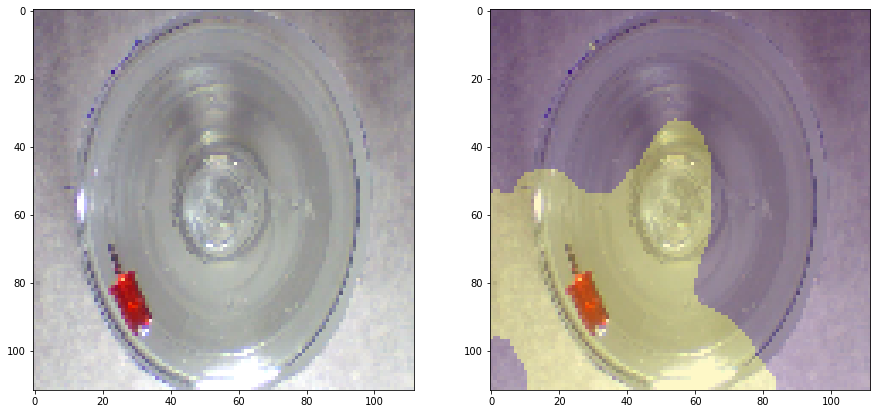

Threshold: 5217.81787109375 MaxValue: 212293.5
GT: scratch_neck, anomaly detected: True


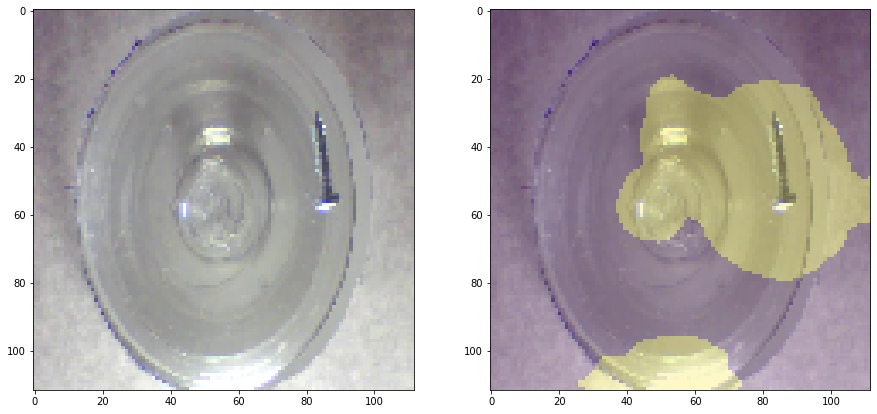

Threshold: 5217.81787109375 MaxValue: 75201.2265625
GT: scratch_head, anomaly detected: True


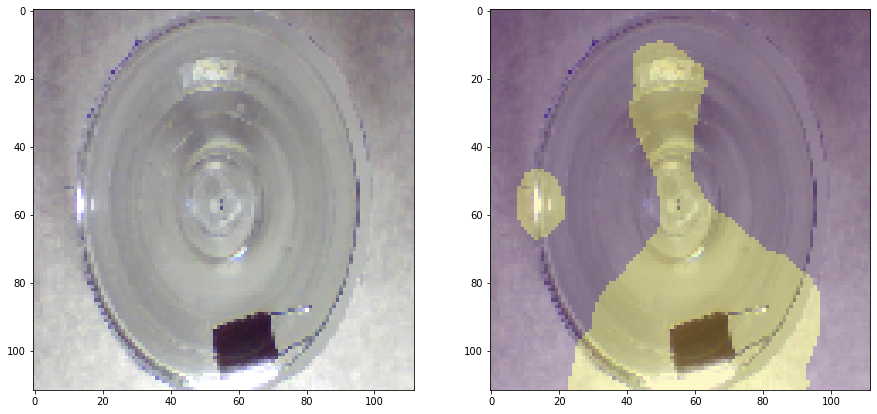

Threshold: 5217.81787109375 MaxValue: 174721.125
GT: scratch_neck, anomaly detected: True


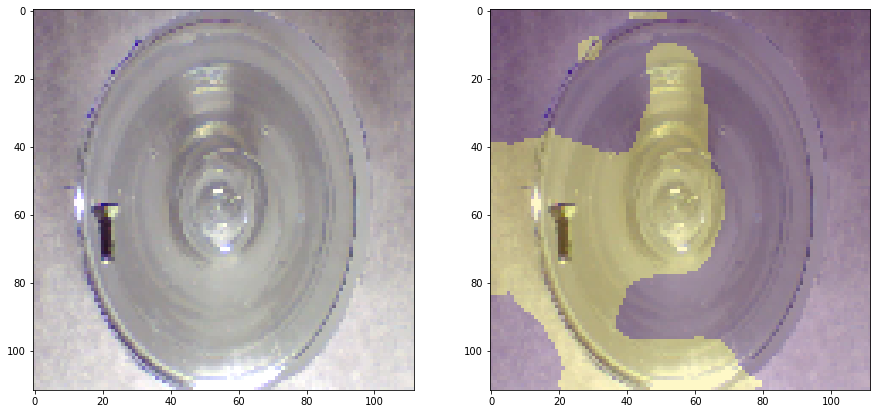

Threshold: 5217.81787109375 MaxValue: 66224.1015625
GT: thread_top, anomaly detected: True


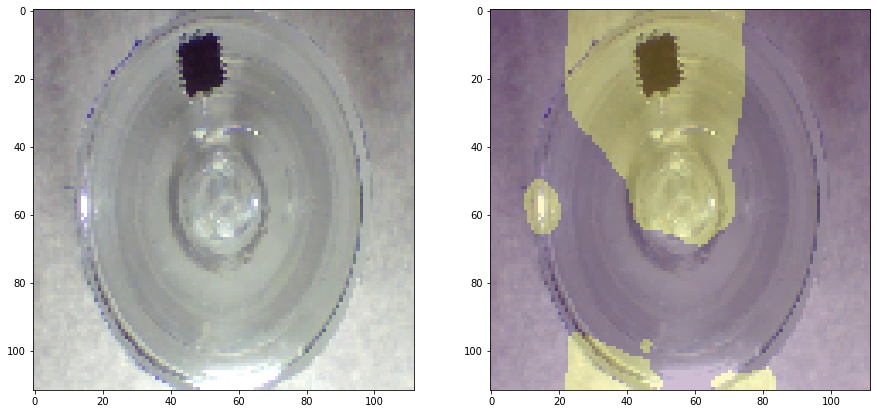

Threshold: 5217.81787109375 MaxValue: 127724.265625
GT: scratch_neck, anomaly detected: True


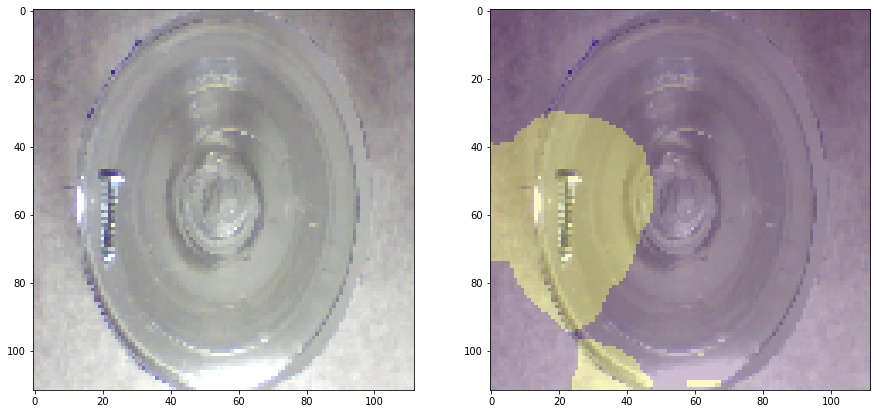

Threshold: 5217.81787109375 MaxValue: 49561.06640625
GT: scratch_neck, anomaly detected: True


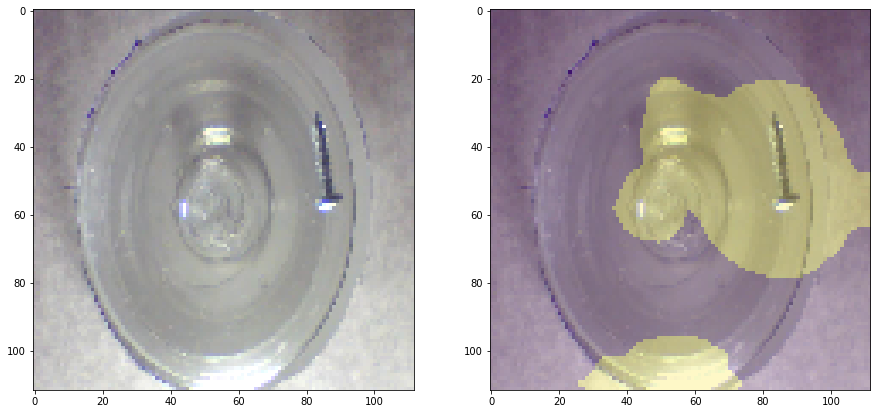

Threshold: 5217.81787109375 MaxValue: 71328.515625
GT: manipulated_front, anomaly detected: True


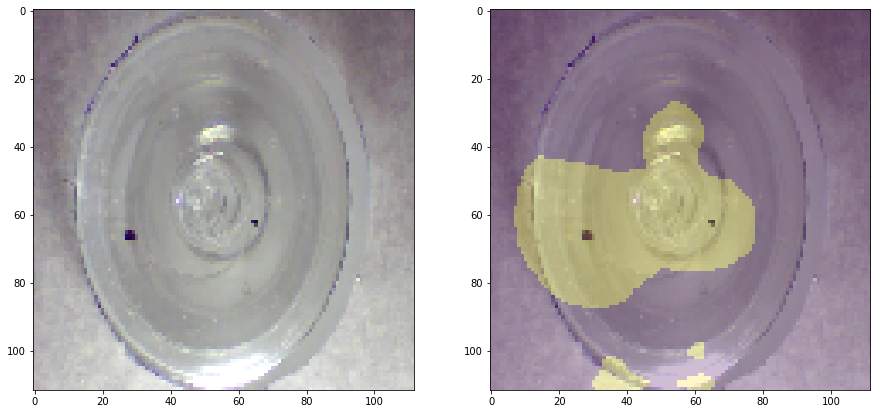

Threshold: 5217.81787109375 MaxValue: 92143.1015625
GT: thread_side, anomaly detected: True


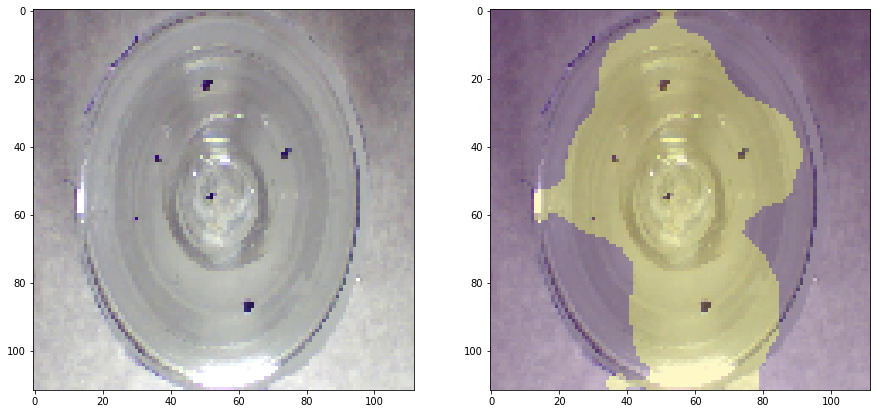

Threshold: 5217.81787109375 MaxValue: 150661.796875
GT: thread_side, anomaly detected: True


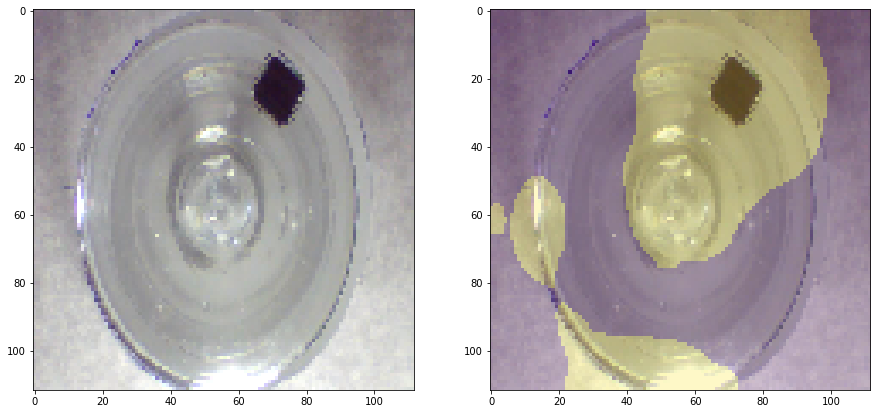

Threshold: 5217.81787109375 MaxValue: 118524.640625
GT: thread_side, anomaly detected: True


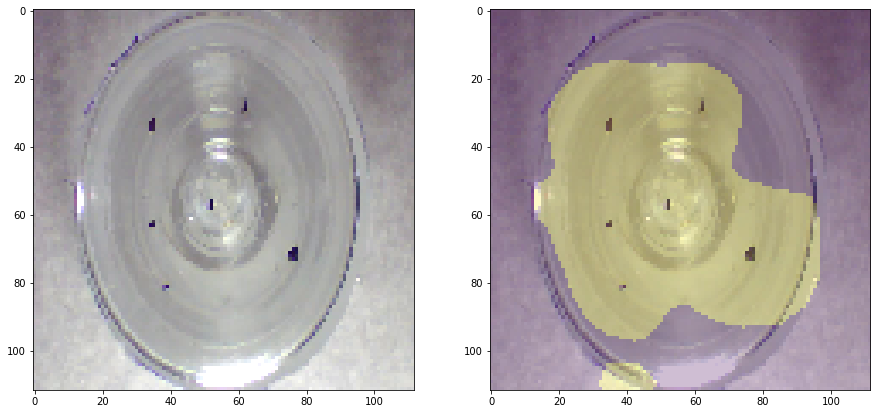

Threshold: 5217.81787109375 MaxValue: 144279.453125
GT: thread_side, anomaly detected: True


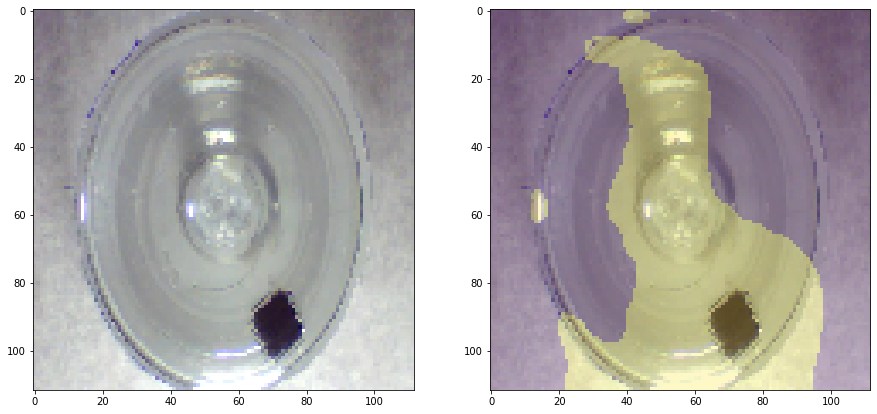

Threshold: 5217.81787109375 MaxValue: 149652.546875
GT: scratch_neck, anomaly detected: True


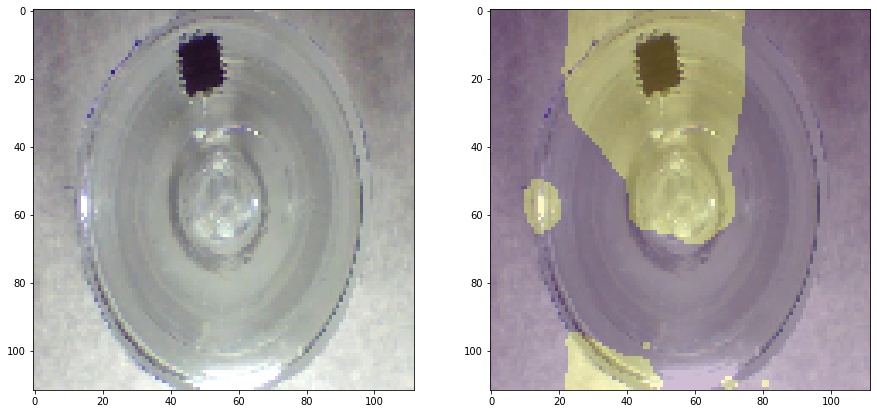

Threshold: 5217.81787109375 MaxValue: 128273.6640625
GT: scratch_neck, anomaly detected: True


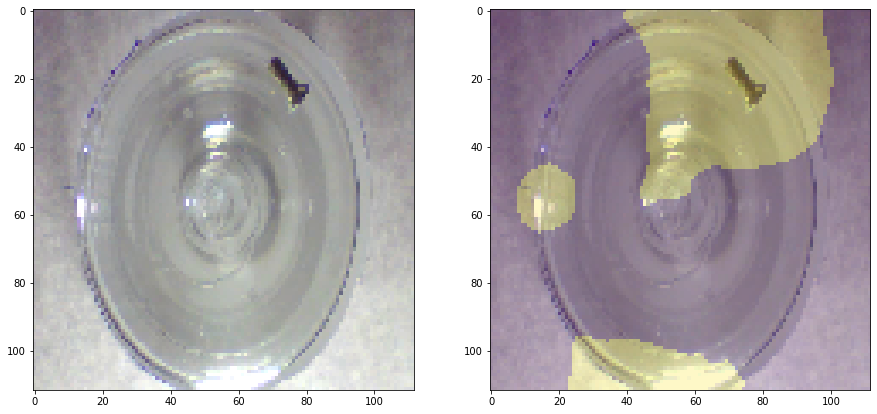

Threshold: 5217.81787109375 MaxValue: 71428.015625
GT: manipulated_front, anomaly detected: True


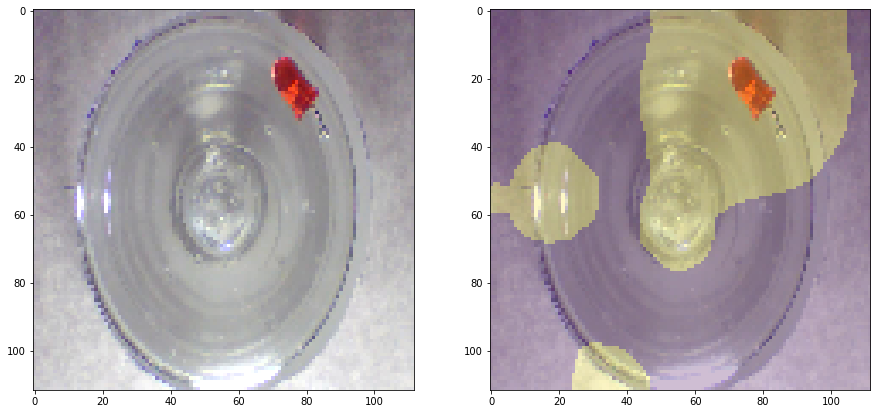

Threshold: 5217.81787109375 MaxValue: 204846.765625
GT: scratch_neck, anomaly detected: True


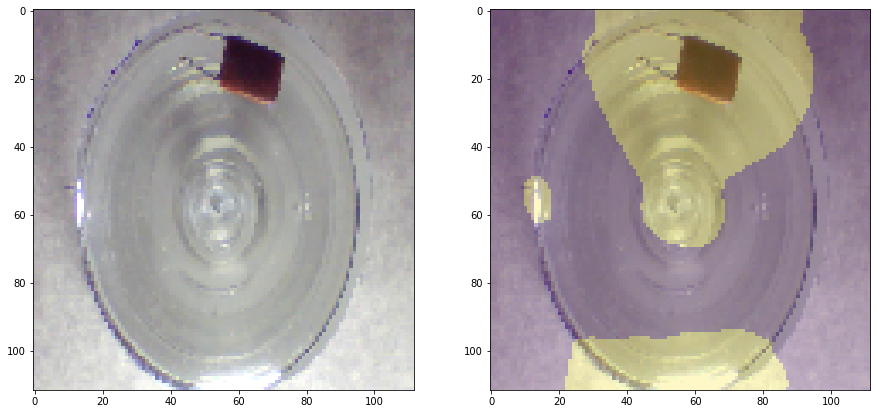

Threshold: 5217.81787109375 MaxValue: 135422.265625
GT: scratch_neck, anomaly detected: True


In [22]:
for i in range(100):
    x_batch, y_batch = next(test_generator)    
    hotmaps = as_model(x_batch)
    for x, y, hotmap in zip(x_batch, y_batch, hotmaps):

        prediction = np.any(hotmap > as_model.threshold)

        hotmap = resize(hotmap, x.shape[:-1], anti_aliasing = True)
        mask = np.where(hotmap > as_model.threshold, 1, 0)
        

        f, axarr = plt.subplots(1,2, figsize=(15,15))
        axarr[0].imshow(x)
        axarr[1].imshow(mask)
        axarr[1].imshow(x, alpha = 0.75)
        plt.show()

        print(f"Threshold: {as_model.threshold.numpy()} MaxValue: {hotmap.max()}")
        print(f"GT: {classes[int(y)]}, anomaly detected: {prediction}")
    